# BÀI TẬP PHÂN LOẠI ẢNH

## 📘 (1) Giới Thiệu
### 🏯 **BÀI TOÁN PHÂN LOẠI CHỮ NHẬT KMNIST BẰNG CÁC MÔ HÌNH PHÂN LOẠI**
****
### ℹ️ **Thông tin học viên**

Họ tên: Bùi Tấn Thuận  
MSHV: MIT24202  
Lớp: Học Máy - Machine Learning

### ℹ️ **Giới thiệu bài toán** <br>
Bài toán phân loại chữ **KMNIST** là bài toán phân loại ảnh với **10** loại chữ Hiragana cổ, sử dụng các mô hình học máy và học sâu như MLPClassifier, CNN và Transformer để phân loại. Trong quá trình thực hiện, bài toán cũng trình bày quá trình khám phá dữ liệu cũng như đánh giá, so sánh, phân tích mẫu đúng, mẫu sai, đồ thị tổn thất và độ chính xác của các loại mô hình.

### 🎯 **Mục tiêu** <br>
- Làm quen với quy trình đầy đủ của một bài toán phân loại ảnh trong thị giác máy tính:
    - Cài đặt và Import thư viện.
    - Tải và tiền xử lý dữ liệu.
    - Khám phá dữ liệu (EDA).
    - Xây dựng và huấn luyện các mô hình phân loại.
    - Đánh giá mô hình qua các đồ thị loss/accuracy và qua việc phân tích lỗi.
- Thực hành với dữ liệu ảnh tương tự tập MNIST:
    - Với 10 loại chữ khác nhau.
    - Nhãn gồm: số từ 0 đến 9 để phân loại (Class)

### ℹ️ **Tập dữ liệu** <br>

Tập dữ liệu KMnist được trích xuất từ sách cổ Nhật thế kỷ 18, do Trung tâm CODH (ROIS-DS) phát hành. Được tổ chức thành 2 file kmnist_test.csv và kmnist_train.csv
- Tổng quan:
    - Số lượng ảnh: Hơn **80.000** ảnh.
    - Số lớp: **10** loại chữ Hiragana cổ.
    - Kích thước ảnh: ảnh xám 28x28 pixel.
    - Thuộc về thư viện torchvision.datasets 

Trang chủ: https://www.kaggle.com/datasets/shanshan0820/kmnist
****

## 🧩 (2) Cài đặt & Import thư viện

- Sử dụng các thư viện để hỗ trợ cho việc tiền xử lý, trực quan hóa, hiển thị, xử lý và đánh giá mô hình và dữ liệu.
- Cài đặt thiết bị sử dụng là **CUDA (GPU)** để tăng tốc trong quá trình huấn luyện mô hình. 
****

In [1]:
import torch
import torchvision
from torchvision.datasets import KMNIST, ImageFolder
import torchvision.transforms as transforms
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader, random_split
import random
from torchvision.utils import make_grid
import plotly.express as px
import pandas as pd
import numpy as np
from IPython.display import display,HTML
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from tqdm import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

Device: cuda


## 📥 (3) Tải dữ liệu
- Sử dụng Kaggle CLI API để tải dữ liệu về từ Kaggle
****

In [2]:
import os
import zipfile
import subprocess

# === BƯỚC 1: Cấu hình kaggle.json ===
kaggle_config_dir = os.path.expanduser("~/Desktop/MasterHK2/.kaggle")
os.environ['KAGGLE_CONFIG_DIR'] = kaggle_config_dir

# === BƯỚC 2: Thư mục lưu tập tin tải về ===
download_dir = os.path.expanduser("~/Desktop/MasterHK2/Dataset/kmnist")
os.makedirs(download_dir, exist_ok=True)

# === BƯỚC 3: Tải dữ liệu từ Kaggle ===
zip_path = os.path.join(download_dir, "kmnist.zip")
if not os.path.exists(zip_path):
    subprocess.run([
        "kaggle", "datasets", "download",
        "-d", "shanshan0820/kmnist",
        "-p", download_dir
    ])
    print("📦 Đã tải về file kmnist.zip")
else:
    print("✅ File kmnist.zip đã tồn tại, bỏ qua bước tải.")

# === BƯỚC 4: Giải nén ===
extract_dir = os.path.join(download_dir, "kmnist")
if not os.path.exists(extract_dir):
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_dir)
    print(f"✅ Đã giải nén dữ liệu vào: {extract_dir}")
else:
    print(f"📂 Dữ liệu đã được giải nén sẵn tại: {extract_dir}")

✅ File kmnist.zip đã tồn tại, bỏ qua bước tải.
📂 Dữ liệu đã được giải nén sẵn tại: C:\Users\cva16/Desktop/MasterHK2/Dataset/kmnist\kmnist


## ⏳ (4) Tiền xử lý
- Định nghĩa hàm KMNISTCSVDataset để chuyển ảnh và nhãn của tập dữ liệu từ file csv sang Tensor của Pytorch
****

In [3]:
import pandas as pd
import torch
from torch.utils.data import Dataset, DataLoader

class KMNISTCSVDataset(Dataset):
    def __init__(self, csv_path, transform=None):
        self.data = pd.read_csv(csv_path)
        self.transform = transform

        # label là cột đầu tiên
        self.labels = self.data.iloc[:, 1].values.astype('int64')
        self.images = self.data.iloc[:, 2:].values.astype('float32') / 255.0  # chuẩn hóa

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        image = self.images[idx].reshape(28, 28)  # reshape về ảnh 2D
        image = torch.tensor(image).unsqueeze(0)  # thêm channel → (1, 28, 28)
        label = torch.tensor(self.labels[idx])

        if self.transform:
            image = self.transform(image)

        return image, label

In [4]:
data_dir = os.path.expanduser("~/Desktop/MasterHK2/Dataset/kmnist/kmnist")

# Tập huấn luyện
train_dataset_full = KMNISTCSVDataset(os.path.join(data_dir, "kmnist_train.csv"))

# Tập kiểm tra
test_dataset = KMNISTCSVDataset(os.path.join(data_dir, "kmnist_test.csv"))

## 📊 (5) EDA - Khám phá dữ liệu

Trong phần này, chúng ta sẽ thực hiện một số phân tích sơ bộ về dữ liệu hình ảnh:

- Hiển thị danh sách các lớp
- Hiển thị một số ảnh mẫu từ tập huấn luyện.
- Hiển thị thông tin của 1 ảnh
- Phân tích phân phối số lượng ảnh theo từng lớp.
- Kiểm tra sự cân bằng dữ liệu giữa các tập huấn luyện, kiểm thử và kiểm tra (train/val/test).

Các bước này giúp ta hiểu rõ hơn về dữ liệu trước khi đưa vào huấn luyện mô hình.

****

### 5.1. ▶️ Hiển thị danh sách lớp
Hiển thị tên các danh sách lớp thành lưới 2x5.
****

In [5]:
class_names = sorted(set(train_dataset_full.labels))

# số cột hiển
columns = 5
colors = ['#f2f2f2', '#e0f7fa', '#fbe9e7', '#e8f5e9', '#f3e5f5']  # Màu nền xen kẽ cho các cột

# Tạo HTML để hiển thị dạng grid

title = f"Danh sách {len(class_names)} lớp"

html = f"""
<h3 style='text-align: center; font-weight: bold; font-family: sans-serif; color: #2c3e50; margin-bottom: 20px;'>
  {title}
</h3>
<div style='display: grid; grid-template-columns: repeat(%d, 1fr); gap: 8px; font-family: sans-serif; font-size: 14px;'>
""" % columns

for i, name in enumerate(class_names):
    color = colors[i % columns]  # Màu xen kẽ theo cột
    html += f"<div style='padding: 6px 10px; background: {color}; border-radius: 4px;'>{name}</div>"

html += "</div>"

display(HTML(html))


### 5.2. ▶️ Hiển thị một số ảnh từ tập train
Hiển thị 100 ảnh từ các lớp tạo thành lưới 100x100.
****

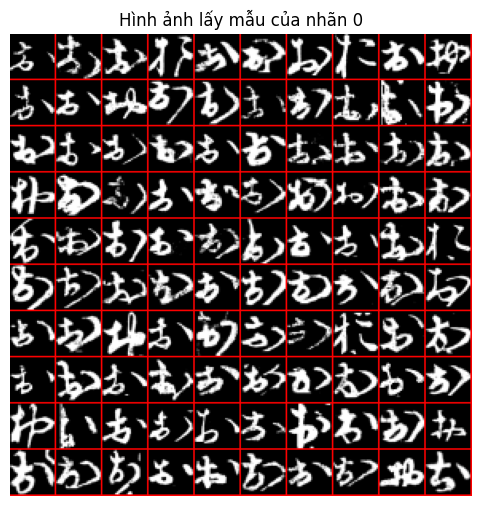

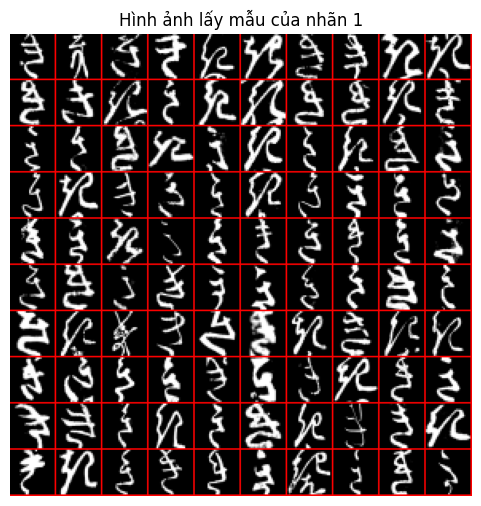

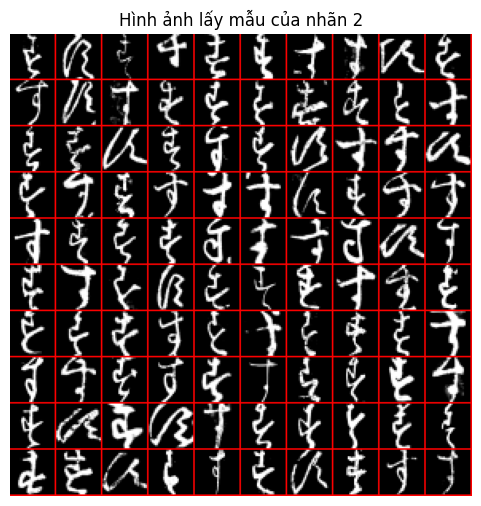

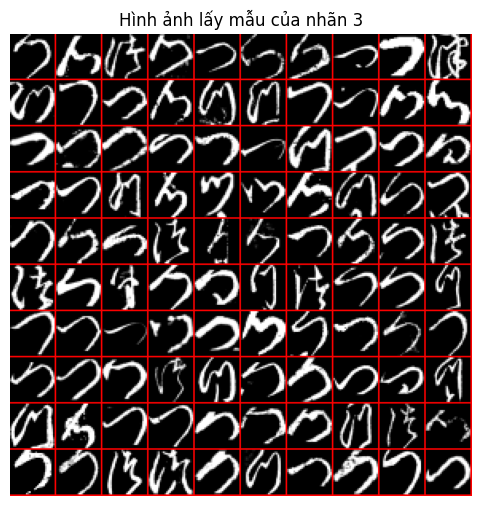

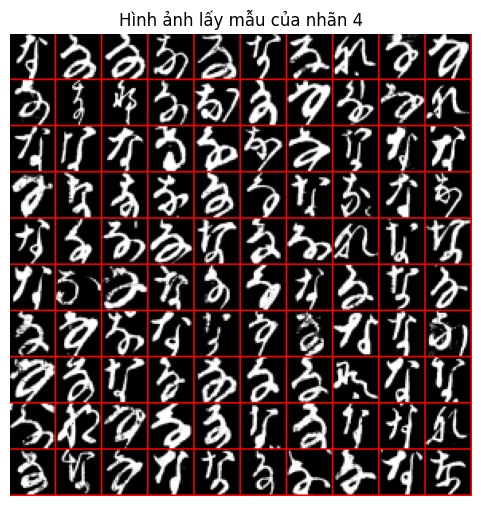

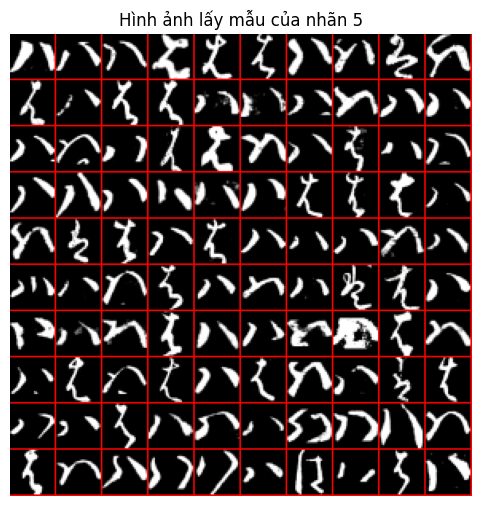

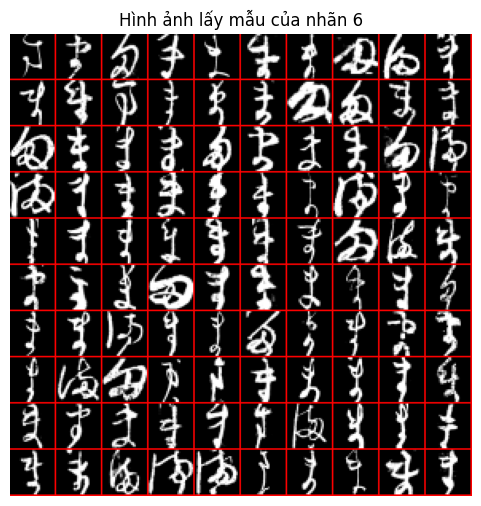

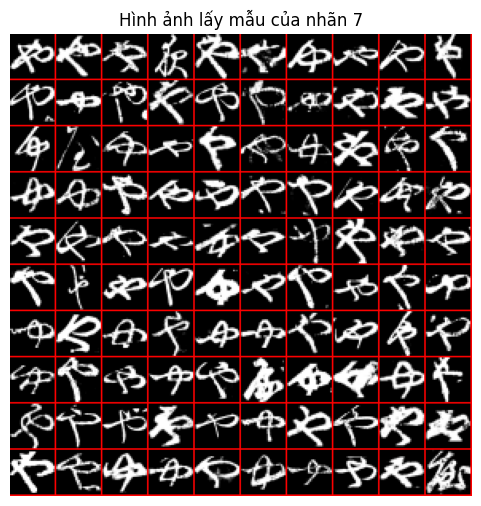

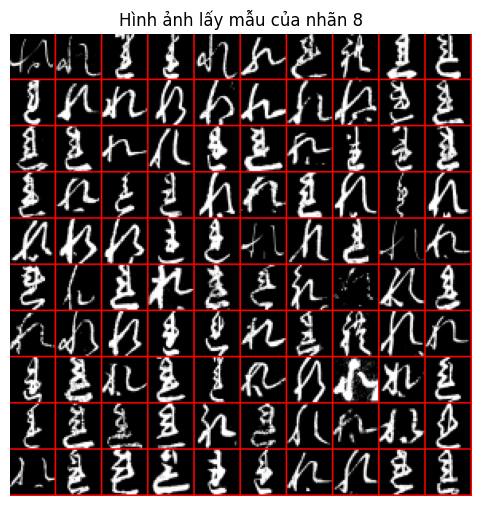

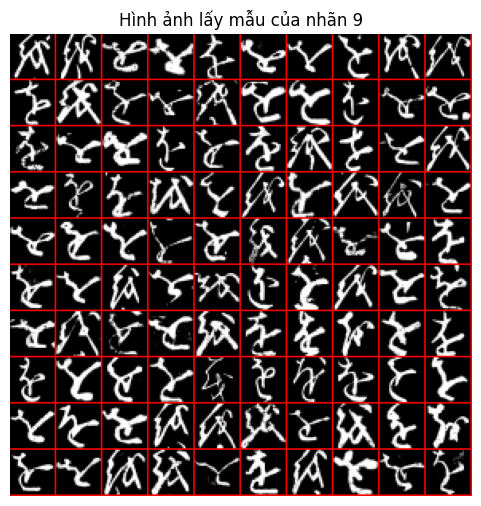

In [6]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image, ImageDraw
import random
import torchvision.transforms.functional as TF

# Chuyển ảnh từ xám sang RGB
def to_rgb(tensor_img):
    return TF.to_pil_image(tensor_img.repeat(3, 1, 1))  # (1, 28, 28) -> (3, 28, 28)

# Tạo ảnh 10x10 (100 ảnh) với đường viền 1px màu đỏ
def make_grid_image(images, border=1):
    size = 28 + border
    grid_img = Image.new('RGB', (size*10, size*10), (255, 255, 255))
    for i in range(10):
        for j in range(10):
            img = to_rgb(images[i * 10 + j])
            canvas = Image.new('RGB', (size, size), (255, 0, 0))
            canvas.paste(img, (border//2, border//2))
            grid_img.paste(canvas, (j*size, i*size))
    return grid_img

# Hiển thị ảnh ghép cho mỗi nhãn
for label in class_names:
    indices = np.where(train_dataset_full.labels == label)[0]
    sampled = torch.utils.data.Subset(train_dataset_full, indices.tolist())
    selected_imgs = [sampled[i][0] for i in random.sample(range(len(sampled)), 100)]
    grid_img = make_grid_image(selected_imgs)
    plt.figure(figsize=(6,6))
    plt.imshow(grid_img)
    plt.axis('off')
    plt.title(f"Hình ảnh lấy mẫu của nhãn {label}")
    plt.show()

### 5.3. ▶️ Hiển thị thông tin ảnh
****

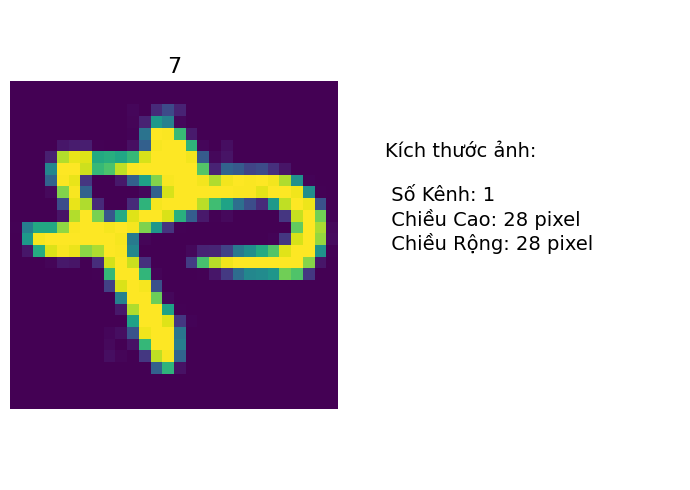

In [9]:
img, label = train_dataset_full[1]  # ảnh đầu tiên
channel, height, width = img.shape
  # Chuyển đổi chỉ số nhãn thành tên nhãn

# Hiển thị ảnh và kích thước
img = img.permute(1, 2, 0)
fig, axs = plt.subplots(1, 2, figsize=(7, 5))

# Cột 1: Hiển thị ảnh
axs[0].imshow(img)
axs[0].axis('off')
axs[0].set_title(label.item(), fontsize=16)

# Cột 2: Thông số kỹ thuật
axs[1].axis('off')
axs[1].text(0.1, 0.6, 
            f"Kích thước ảnh:\n \n Số Kênh: {channel} \n Chiều Cao: {height} pixel \n Chiều Rộng: {width} pixel", 
            fontsize=14, va='center')

plt.tight_layout()
plt.show()


### 5.4. ▶️ Hiển thị phân bố các mẫu trong tập Train
****

In [169]:
import plotly.io as pio
pio.renderers.default = "notebook+pdf"

# Hàm tính phân phối nhãn

import pandas as pd

class_names = [str(i) for i in class_names]
label_series = pd.Series(train_dataset_full.labels)
train_counts = label_series.value_counts().sort_index()

fig = px.bar(
    train_counts,
    x=class_names,
    y=train_counts,
    color=class_names,
    labels={
        'Label': 'Nhãn'
    },
    title='<b>Phân phối nhãn</b>'
    )
fig.update_layout(
    width=800,
    height=500,
    xaxis_title='Nhãn',
    yaxis_title='Số lượng',  # Xoay nhãn trục x để dễ đọc
    legend_title='Nhãn',
    title={
    'y':0.95, # Adjust y position slightly for centering effect
    'x':0.5,  # Center the title horizontally
    'xanchor': 'center',
    'yanchor': 'top'
    },
)
fig.show()

- Phân bố đều:
    - Tất cả các nhãn từ 0 đến 9 đều có số lượng là 60.000 mẫu. Điều này cho thấy mô hình sẽ không thiên vị mẫu nào
****

## 🛠️ (6) Chia Train, Val, và Test và chuẩn bị Dataloader

In [170]:
from sklearn.model_selection import train_test_split
from torch.utils.data import Subset
from torch.utils.data import DataLoader
from torchvision import transforms

train_idx, val_idx = train_test_split(
    list(range(len(train_dataset_full))),
    test_size=0.2,
    stratify=train_dataset_full.labels
)

train_dataset = Subset(train_dataset_full, train_idx)
val_dataset = Subset(train_dataset_full, val_idx)

### 6.1. Chuẩn bị DataLoader

In [171]:
# Tạo DataLoader
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

# Hiển thị kích thước của các tập dữ liệu
sizes = [len(train_dataset), len(val_dataset), len(test_dataset)]
names = ['Train', 'Validation', 'Test']
fig_bar = px.bar(
    x=names, 
    y=sizes, 
    labels={'x': 'Dataset', 'y': 'Size'}, 
    title='<b>Kích thước các tập dữ liệu</b>',
    color=names,
    text_auto=True)
fig_bar.update_layout(
    width=800, 
    height=500,
    xaxis_title='Tập dữ liệu',
    yaxis_title='Kích thước',
    yaxis=dict(
        tickformat=',d'  # Hiển thị số nguyên, ví dụ: 14614 thay vì 14.6k
    ),
    legend_title_text='Tập dữ liệu',
    title={
    'y':0.95, # Adjust y position slightly for centering effect
    'x':0.5,  # Center the title horizontally
    'xanchor': 'center',
    'yanchor': 'top'
    },)
fig_bar.show()


# Calculate percentages
total = sum(sizes)
percentages = [f"{(s / total) * 100:.1f}%" for s in sizes]

# Create pie chart
fig_pie = px.pie(
    names=names,
    values=sizes,
    title='<b>Tỷ lệ phần trăm các tập dữ liệu</b>',
    hole=0.3  # Optional: makes it a donut chart
)
fig_pie.update_traces(
    textinfo='label+percent',
    hovertemplate='%{label}: %{value} mẫu (%{percent})'
)
fig_pie.update_layout(
    width=800, 
    height=500,
    legend_title_text='Tập dữ liệu',
    title={
        'y': 0.95,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    }
)
fig_pie.show()

- Tập dữ liệu có tỉ lệ ~ 70-15-15.
- Tập train chiếm 70%. Phù hợp để mô hình học.
- Tập validation và test mỗi tập chiếm 15%. Phù hợp cho việc đánh giá.

### 6.2. ▶️ So sánh số lượng mẫu trong các tập Train/Val/Test
****

In [ ]:
import plotly.graph_objects as go
import plotly.io as pio
from collections import Counter
pio.renderers.default = "notebook+pdf"

def get_label_distribution(data):
    if isinstance(data, torch.utils.data.Subset):
        base_dataset = data.dataset
        indices = data.indices
        labels = [base_dataset.labels[i] for i in indices]
    else:
        labels = data.labels
    return pd.Series(Counter(labels)).sort_index()


df = pd.DataFrame({
    'Train': get_label_distribution(train_dataset),
    'Validation': get_label_distribution(val_dataset),
    'Test': get_label_distribution(test_dataset)
})

labels = [name for name in class_names]
fig = go.Figure()
for col in df.columns:
    fig.add_bar(x=df.index, y=df[col], name=col)
fig.update_layout(barmode='group', title='<b>Phân phối nhãn theo tập dữ liệu</b>',)
fig.update_layout(
    width=800,
    height=500,
    xaxis_title='Nhãn',
    yaxis_title='Số lượng ảnh',
    legend_title_text='Tập dữ liệu',
    title={
        'y':0.95, # Adjust y position slightly for centering effect
        'x':0.5,  # Center the title horizontally
        'xanchor': 'center',
        'yanchor': 'top'
    },
)
fig.show()

- Mỗi nhãn đều có mặt trong cả 3 tập, không có lớp nào bị thiếu hoàn toàn ở Validation hoặc Test → điều này đảm bảo mô hình có thể học và kiểm tra trên tất cả các lớp.
- Với mỗi lớp, tỉ lệ giữa Train–Val–Test gần như là 70–15–15.
****

## 🏗️ (6) Xây dựng 10 mô hình phân loại
****

### 6.1. 🤖 Mô hình SoftmaxRegression
- Mô hình gồm:
    - 1 lớp Linear (FC) biến đổi đặc trưng của ảnh thành số lớp phân loại.
****

In [173]:
class SoftmaxRegression(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc = nn.Linear(1*28*28, 10)
    def forward(self, x):
        x = x.view(x.size(0), -1)                   # (B, 3, 100, 100) -> (B, 3*100*100)
        return self.fc(x)

### 6.2. 🤖 Mô hình MultiLayerClassifier
- Mô hình gồm:
    - 1 lớp Flatten để duỗi thẳng các đặc trưng ảnh thành 1 vecto 1 chiều.
    - 3 lớp Linear(FC) dùng để biến đổi đặc trưng.
    - Xen kẻ các lớp Linear là 2 lớp Relu.
****

In [174]:
class MultiLayerClassifier(nn.Module):
    def __init__(self):
        super().__init__()
        self.model = nn.Sequential(
            nn.Flatten(),                           # (1, 28, 28) -> (B, 1*28*28)
            nn.Linear(1*28*28, 512),              # (B, 1*28*28) -> (B, 512)
            nn.ReLU(),
            nn.Linear(512, 128),                    # (B, 512) -> (B, 128)    
            nn.ReLU(),
            nn.Linear(128, 90)                      # (B, 128) -> (B, 90)
        )
    def forward(self, x): return self.model(x)

### 6.3. 🤖 Mô hình CNNFlatten
- Mô hình gồm:
    - 2 lớp Conv. Mỗi lớp đi kèm với ReLU và MaxPool.
    - 2 lớp Linear. Với lớp đầu tiên đi kèm với ReLU.
****

In [175]:
class CNNFlatten(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(1, 32, 3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(32, 64, 3, padding=1)
        self.fc1 = nn.Linear(64 * 7 * 7, 128)
        self.fc2 = nn.Linear(128, 10)
    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))            
        x = self.pool(F.relu(self.conv2(x)))            
        x = x.view(x.size(0), -1)                       
        x = F.relu(self.fc1(x))                         
        return self.fc2(x)                              

### 6.4. 🤖 Mô hình CNNGlobalAvgPool
- Mô hình gồm:
    - 2 lớp Conv. Mỗi lớp đi kèm với ReLU và MaxPool.
    - 1 lớp AvgPool để giảm đặc trưng.
    - 2 lớp Linear. Với lớp đầu tiên đi kèm với ReLU. 
****

In [176]:
class CNNGlobalAvgPool(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(1, 32, 3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(32, 64, 3, padding=1)
        self.gap = nn.AdaptiveAvgPool2d(1)
        self.fc1 = nn.Linear(64, 128)
        self.fc2 = nn.Linear(128, 10)
    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))            
        x = self.pool(F.relu(self.conv2(x)))            
        x = self.gap(x).view(x.size(0), -1)             
        x = F.relu(self.fc1(x))                         
        return self.fc2(x)                              

### 6.5. 🤖 Mô hình Vit
- Mô hình gồm:
    - Patch Tokenization và Embedding:
        - Sử dụng Conv để chia ảnh thành L patch và ánh xạ vào không gian dmodel chiều.
    - Positional Embedding: có sử dụng, learnable.
    - CLS token: có sử dụng, learnable.
    - Biến đổi đặc trưng:
        - Dùng 4 tầng Transformer Encoder.
        - dmodel= 64, num-heads= 4.
    - Classification head:
        - Sử dụng CLS token để phân loại.
        - Biến đổi bằng một lớp FC (có 90 đầu ra).
****

In [177]:
    
# Vision Transformer
class ViTClassifier(nn.Module):
    def __init__(self, num_classes=len(class_names), image_size=28, patch_size=10, in_channels=1, 
                 d_model=64, nhead=4, num_layers=4, dim_feedforward=512):
        super().__init__()

        self.image_size = image_size
        self.patch_size = patch_size

        # === 1. Patch embedding bằng Conv2D ===
        self.patch_embed = nn.Conv2d(
            in_channels=in_channels,
            out_channels=d_model,                       
            kernel_size=patch_size,
            stride=patch_size,
            padding=0  # bạn có thể cho phép cấu hình padding nếu muốn
        )

        # === 2. Tính số lượng patch bằng dummy input ===
        with torch.no_grad():
            dummy = torch.zeros(1, in_channels, image_size, image_size)
            out = self.patch_embed(dummy)  # (1, d_model, H', W')
            self.grid_h, self.grid_w = out.shape[2], out.shape[3]
            self.num_patches = self.grid_h * self.grid_w

        # === 3. Positional + CLS token ===
        self.cls_token = nn.Parameter(torch.zeros(1, 1, d_model))  # (1, 1, d_model)
        self.pos_embed = nn.Parameter(torch.zeros(1, self.num_patches + 1, d_model))  # (1, N+1, d_model)

        # === 4. Transformer Encoder ===
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=d_model, nhead=nhead,
            dim_feedforward=dim_feedforward, batch_first=True
        )
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)

        # === 5. Classification head ===
        self.cls_head = nn.Linear(d_model, num_classes)

        self._init_weights()

    def _init_weights(self):
        nn.init.normal_(self.cls_token, std=1e-6)
        nn.init.normal_(self.pos_embed, std=1e-6)
        nn.init.xavier_uniform_(self.cls_head.weight)
        nn.init.constant_(self.cls_head.bias, 0)

    def forward(self, x):
        """
        x: Tensor (B, in_channels, image_size, image_size)
        """
        B = x.size(0)
        x = self.patch_embed(x)          # (B, d_model, H', W')
        x = x.flatten(2).transpose(1, 2) # (B, num_patches, d_model)

        cls_tokens = self.cls_token.expand(B, -1, -1)  # (B, 1, d_model)
        x = torch.cat((cls_tokens, x), dim=1)          # (B, num_patches + 1, d_model)

        x = x + self.pos_embed[:, :x.size(1), :]       # positional embedding (an toàn)
        x = self.transformer(x)                        # (B, N+1, d_model)

        cls_output = x[:, 0]                           # (B, d_model)
        logits = self.cls_head(cls_output)             # (B, num_classes)
        return logits

### 6.6. 🤖 Mô hình TransformerUnfold
- Mô hình gồm:
    - Patch Tokenization:
        - Sử dụng Unfold có kích thước patch_size x patch_size để chạy qua các vùng của ảnh.
    - Embedding:
        - Sử dụng lớp Linear để ánh xạ các patch sang dmodel chiều.
    - Positional Embedding: có sử dụng, learnable.
    - CLS token: có sử dụng, learnable.
    - Biến đổi đặc trưng:.
        - Dùng 4 tầng Transformer Encoder.
        - dmodel= 64, num-heads= 4.
    - Classification head:
        - Sử dụng CLS token để phân loại.
        - Biến đổi bằng một lớp FC (có 90 đầu ra).
****

In [178]:
import torch
import torch.nn as nn

class TransformerUnfold(nn.Module):
    def __init__(self, num_classes=10, patch_size=4, in_channels=1,
                 d_model=64, nhead=4, num_layers=4, dim_feedforward=512):
        super().__init__()

        self.patch_size = patch_size
        self.unfold = nn.Unfold(kernel_size=patch_size, stride=patch_size)

        # === Tính số patch bằng dummy input ===
        with torch.no_grad():
            dummy = torch.zeros(1, in_channels, 28, 28)
            patches = self.unfold(dummy)  # (1, patch_dim, num_patches)
            self.num_patches = patches.shape[-1]
            self.patch_dim = patches.shape[1]

        # === Linear projection từ patch_dim → d_model ===
        self.proj = nn.Linear(self.patch_dim, d_model)

        # === [CLS] token và positional embedding ===
        self.cls_token = nn.Parameter(torch.zeros(1, 1, d_model))
        self.pos_embed = nn.Parameter(torch.zeros(1, self.num_patches + 1, d_model))

        # === Transformer Encoder ===
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=d_model, nhead=nhead,
            dim_feedforward=dim_feedforward, batch_first=True
        )
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)

        # === Classification head ===
        self.cls_head = nn.Linear(d_model, num_classes)

        # === Khởi tạo trọng số ===
        self._init_weights()

    def _init_weights(self):
        nn.init.normal_(self.cls_token, std=1e-6)
        nn.init.normal_(self.pos_embed, std=1e-6)
        nn.init.xavier_uniform_(self.cls_head.weight)
        nn.init.constant_(self.cls_head.bias, 0)

    def forward(self, x):
        """
        x: Tensor (B, 1, 28, 28)
        """
        B = x.size(0)
        patches = self.unfold(x)  # (B, patch_dim, num_patches)
        x = patches.transpose(1, 2)  # (B, num_patches, patch_dim)
        x = self.proj(x)  # (B, num_patches, d_model)

        # Thêm CLS token
        cls_tokens = self.cls_token.expand(B, -1, -1)  # (B, 1, d_model)
        x = torch.cat((cls_tokens, x), dim=1)  # (B, num_patches+1, d_model)

        # Thêm positional embedding
        x = x + self.pos_embed[:, :x.size(1), :]  # khớp chiều

        # Transformer encoder
        x = self.transformer(x)  # (B, num_patches+1, d_model)

        # Lấy CLS token ra phân loại
        cls_output = x[:, 0]  # (B, d_model)
        logits = self.cls_head(cls_output)  # (B, num_classes)
        return logits

### 6.7. 🤖 Mô hình TransformerPatchOVLPConv
- Mô hình gồm:
    - Patch Tokenization và Embedding:
        - Sử dụng Conv để chia ảnh thành L patch và ánh xạ vào không gian dmodel chiều.
        - Tuy nhiên do stride = patch/2 nên các patch sẽ bị trùng nhau một nữa.
    - Positional Embedding: có sử dụng, learnable.
    - CLS token: có sử dụng, learnable.
    - Biến đổi đặc trưng:
        - Dùng 4 tầng Transformer Encoder.
        - dmodel= 64, num-heads= 4.
    - Classification head:
        - Sử dụng CLS token để phân loại.
        - Biến đổi bằng một lớp FC (có 90 đầu ra).
****

In [179]:
import torch
import torch.nn as nn

class TransformerPatchOVLPConv(nn.Module):
    def __init__(self, num_classes=10, patch_size=4, in_channels=1,
                 d_model=64, nhead=4, num_layers=4, dim_feedforward=512):
        super().__init__()

        # === 1. Patch embedding bằng Conv2D có overlap ===
        self.patch_embed = nn.Conv2d(
            in_channels=in_channels, out_channels=d_model,
            kernel_size=patch_size, stride=patch_size // 2  # stride < kernel_size => overlapped patches
        )

        # === Tính số patch chính xác bằng dummy input ===
        with torch.no_grad():
            dummy = torch.zeros(1, in_channels, 28, 28)
            out = self.patch_embed(dummy)  # (1, d_model, H_out, W_out)
            h, w = out.shape[2], out.shape[3]
            self.num_patches = h * w

        # === CLS token và Positional Embedding ===
        self.cls_token = nn.Parameter(torch.zeros(1, 1, d_model))
        self.pos_embed = nn.Parameter(torch.zeros(1, self.num_patches + 1, d_model))

        # === Transformer Encoder ===
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=d_model, nhead=nhead,
            dim_feedforward=dim_feedforward, batch_first=True
        )
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)

        # === Classification Head ===
        self.cls_head = nn.Linear(d_model, num_classes)

        # === Khởi tạo trọng số ===
        self._init_weights()

    def _init_weights(self):
        nn.init.normal_(self.cls_token, std=1e-6)
        nn.init.normal_(self.pos_embed, std=1e-6)
        nn.init.xavier_uniform_(self.cls_head.weight)
        nn.init.constant_(self.cls_head.bias, 0)

    def forward(self, x):
        """
        x: Tensor (B, 1, 28, 28)
        """
        B = x.size(0)
        x = self.patch_embed(x)  # (B, d_model, H_out, W_out)
        x = x.flatten(2).transpose(1, 2)  # (B, num_patches, d_model)

        # Thêm CLS token
        cls_tokens = self.cls_token.expand(B, -1, -1)  # (B, 1, d_model)
        x = torch.cat((cls_tokens, x), dim=1)  # (B, num_patches+1, d_model)

        # Thêm positional embedding
        x = x + self.pos_embed[:, :x.size(1), :]  # đảm bảo khớp chiều

        # Transformer Encoder
        x = self.transformer(x)

        # Classification từ CLS token
        cls_output = x[:, 0]  # (B, d_model)
        logits = self.cls_head(cls_output)  # (B, num_classes)
        return logits

### 6.8. 🤖 Mô hình CNNChannelTransformer
- Mô hình gồm:
    - Lớp: CNNChannelTransformer
    - Kỹ thuật sử dụng: CNN + Transformer.
    - CNN Module:
        - Sử dụng hai lớp Conv, xen kẻ với MaxPool.
        - Đặc trưng thu được có dạng: (B, C, H, W).
    - Tokenization:
        - Từ đặc trưng (B, C, H, W): hiểu mỗi channel là một token.
        - Sử dụng một lớp FC để biến đặc trưng vào d-model.
    - Positional Embedding: có sử dụng, learnable.
    - CLS token: có sử dụng, learnable.
    - Biến đổi đặc trưng:
        - Dùng 4 tầng Transformer Encoder.
        - dmodel= 64, num-heads= 4.
    - Classification head:
        - Sử dụng CLS token để phân loại.
        - Biến đổi bằng một lớp FC (có 90 đầu ra).
****

In [180]:
import torch
import torch.nn as nn

class CNNChannelTransformer(nn.Module):
    def __init__(self, num_classes=10, in_channels=1, d_model=64, nhead=4, num_layers=4, dim_feedforward=256):
        super(CNNChannelTransformer, self).__init__()

        # === 1. CNN Module ===
        self.cnn_backbone = nn.Sequential(
            nn.Conv2d(in_channels, 16, kernel_size=3, stride=1, padding=1),  # (B, 16, 28, 28)
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),                            # (B, 16, 14, 14)
            nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1),           # (B, 32, 14, 14)
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2)                             # (B, 32, 7, 7)
        )

        self.token_dim = 32  # Số channel sau CNN
        self.feature_dim = 7 * 7  # H * W của mỗi channel

        # === 2. Tokenization: mỗi channel là một token ===
        self.fc_token = nn.Linear(self.feature_dim, d_model)

        # === 3. CLS token và Positional Embedding ===
        self.cls_token = nn.Parameter(torch.zeros(1, 1, d_model))  # (1, 1, d_model)
        self.pos_embed = nn.Parameter(torch.zeros(1, self.token_dim + 1, d_model))  # (1, 33, d_model)

        # === 4. Transformer Encoder ===
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=d_model, nhead=nhead, dim_feedforward=dim_feedforward, batch_first=True
        )
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)

        # === 5. Classification head ===
        self.cls_head = nn.Linear(d_model, num_classes)

        # === 6. Khởi tạo trọng số ===
        self._init_weights()

    def _init_weights(self):
        nn.init.normal_(self.cls_token, std=1e-6)
        nn.init.normal_(self.pos_embed, std=1e-6)
        nn.init.xavier_uniform_(self.cls_head.weight)
        nn.init.constant_(self.cls_head.bias, 0)

    def forward(self, x):
        """
        x: Tensor (B, 1, 28, 28)
        """
        B = x.size(0)
        feat = self.cnn_backbone(x)            # (B, 32, 7, 7)
        feat = feat.view(B, self.token_dim, -1)  # (B, 32, 49)

        tokens = self.fc_token(feat)             # (B, 32, d_model)

        cls = self.cls_token.expand(B, -1, -1)   # (B, 1, d_model)
        x = torch.cat([cls, tokens], dim=1)      # (B, 33, d_model)

        x = x + self.pos_embed[:, :x.size(1), :] # Positional embedding

        x = self.transformer(x)                  # (B, 33, d_model)
        cls_out = x[:, 0, :]                     # (B, d_model)
        logits = self.cls_head(cls_out)          # (B, num_classes)
        return logits

### 6.9. 🤖 Mô hình CNNSpaceTransformer
- Mô hình gồm:
    - Lớp: CNNSpaceTransformer
    - Kỹ thuật sử dụng: CNN + Transformer.
    - CNN Module:
        - Sử dụng hai lớp Conv, xen kẻ với MaxPool.
        - Đặc trưng thu được có dạng: (B, C, H, W).
    - Tokenization:
        - Từ đặc trưng (B, C, H, W): hiểu mỗi pixel trên (H,W) là một token => có H*W tokens; mỗi token có C đặc trưng.
        - Sử dụng một lớp FC để biến đặc trưng vào d-model.
    - Positional Embedding: có sử dụng, learnable.
    - CLS token: có sử dụng, learnable.
    - Biến đổi đặc trưng:
        - Dùng 4 tầng Transformer Encoder.
        - dmodel= 64, num-heads= 4.
    - Classification head:
        - Sử dụng CLS token để phân loại.
        - Biến đổi bằng một lớp FC (có 90 đầu ra).
****

In [181]:
import torch
import torch.nn as nn

class CNNSpaceTransformer(nn.Module):
    def __init__(self, num_classes=10, in_channels=1, d_model=64, nhead=4, num_layers=4, dim_feedforward=256):
        super(CNNSpaceTransformer, self).__init__()

        # === 1. CNN Module ===
        self.cnn_backbone = nn.Sequential(
            nn.Conv2d(in_channels, 16, kernel_size=3, stride=1, padding=1),  # (B, 16, 28, 28)
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),                            # (B, 16, 14, 14)
            nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1),           # (B, 32, 14, 14)
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2)                             # (B, 32, 7, 7)
        )

        self.token_h = 7
        self.token_w = 7
        self.num_tokens = self.token_h * self.token_w  # 49
        self.channel_dim = 32  # Số kênh đặc trưng sau CNN

        # === 2. Tokenization: mỗi vị trí không gian là một token ===
        self.fc_token = nn.Linear(self.channel_dim, d_model)  # Biến đặc trưng C → d_model

        # === 3. CLS token và Positional Embedding ===
        self.cls_token = nn.Parameter(torch.zeros(1, 1, d_model))  # (1, 1, d_model)
        self.pos_embed = nn.Parameter(torch.zeros(1, self.num_tokens + 1, d_model))  # (1, 50, d_model)

        # === 4. Transformer Encoder ===
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=d_model, nhead=nhead, dim_feedforward=dim_feedforward, batch_first=True
        )
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)

        # === 5. Classification head ===
        self.cls_head = nn.Linear(d_model, num_classes)

        # === 6. Init weights ===
        self._init_weights()

    def _init_weights(self):
        nn.init.normal_(self.cls_token, std=1e-6)
        nn.init.normal_(self.pos_embed, std=1e-6)
        nn.init.xavier_uniform_(self.cls_head.weight)
        nn.init.constant_(self.cls_head.bias, 0)

    def forward(self, x):
        """
        x: Tensor (B, 1, 28, 28)
        """
        B = x.size(0)
        feat = self.cnn_backbone(x)              # (B, 32, 7, 7)
        feat = feat.permute(0, 2, 3, 1).reshape(B, -1, self.channel_dim)  # (B, 49, 32)
        tokens = self.fc_token(feat)             # (B, 49, d_model)

        cls = self.cls_token.expand(B, -1, -1)   # (B, 1, d_model)
        x = torch.cat([cls, tokens], dim=1)      # (B, 50, d_model)

        x = x + self.pos_embed[:, :x.size(1), :] # Positional embedding

        x = self.transformer(x)                  # (B, 50, d_model)
        cls_out = x[:, 0, :]                     # (B, d_model)
        logits = self.cls_head(cls_out)          # (B, num_classes)
        return logits

### 6.10. 🤖 Mô hình CNNHybridTransformer
- Mô hình gồm:
    - Lớp: CNNHybridTransformer
    - Kỹ thuật sử dụng: CNN + Transformer.
    - CNN Module:
        - Sử dụng hai lớp Conv, xen kẻ với MaxPool.
        - Đặc trưng thu được có dạng: (B, C, H, W).
    - Tokenization:
        - Nhánh 1:
            - Từ đặc trưng (B, C, H, W): hiểu mỗi channel là một token.
            - Sử dụng một lớp FC để biến đặc trưng vào d-model.
        - Nhánh 2:
            - Từ đặc trưng (B, C, H, W): hiểu mỗi pixel trên (H,W) là một token => có H*W tokens; mỗi token có C đặc trưng.
            - Sử dụng một lớp FC để biến đặc trưng vào d-model.
    - Positional Embedding: có sử dụng, learnable.
    - CLS token: có sử dụng, learnable.
    - Biến đổi đặc trưng:
        - Dùng 4 tầng Transformer Encoder.
        - dmodel= 64, num-heads= 4.
    - Classification head:
        - Tổng hợp 2 nhánh.
        - Sử dụng CLS token để phân loại.
        - Biến đổi bằng một lớp FC (có 90 đầu ra).
****

In [182]:
import torch
import torch.nn as nn

class CNNHybridTransformer(nn.Module):
    def __init__(self, num_classes=10, in_channels=1, d_model=64, nhead=4, num_layers=2, dim_feedforward=128):
        super(CNNHybridTransformer, self).__init__()

        # === 1. CNN backbone ===
        self.backbone = nn.Sequential(
            nn.Conv2d(in_channels, 32, kernel_size=3, stride=1, padding=1),  # (B, 32, 28, 28)
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),                           # (B, 32, 14, 14)
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),           # (B, 64, 14, 14)
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2)                            # (B, 64, 7, 7)
        )

        self.C, self.H, self.W = 64, 7, 7  # Output shape của backbone

        # === 2. Nhánh 1: Channel-as-token ===
        self.channel_fc = nn.Linear(self.H * self.W, d_model)  # mỗi channel → vector
        self.channel_cls_token = nn.Parameter(torch.zeros(1, 1, d_model))
        self.channel_pos_embed = nn.Parameter(torch.zeros(1, self.C + 1, d_model))
        encoder_layer1 = nn.TransformerEncoderLayer(d_model=d_model, nhead=nhead, dim_feedforward=dim_feedforward, batch_first=True)
        self.channel_transformer = nn.TransformerEncoder(encoder_layer1, num_layers=num_layers)

        # === 3. Nhánh 2: Spatial-as-token ===
        self.pixel_fc = nn.Linear(self.C, d_model)
        self.pixel_cls_token = nn.Parameter(torch.zeros(1, 1, d_model))
        self.pixel_pos_embed = nn.Parameter(torch.zeros(1, self.H * self.W + 1, d_model))
        encoder_layer2 = nn.TransformerEncoderLayer(d_model=d_model, nhead=nhead, dim_feedforward=dim_feedforward, batch_first=True)
        self.pixel_transformer = nn.TransformerEncoder(encoder_layer2, num_layers=num_layers)

        # === 4. Head ===
        #self.cls_head = nn.Linear(d_model * 2, num_classes)
        self.cls_head = nn.Linear(d_model, num_classes)

        self._init_weights()

    def _init_weights(self):
        nn.init.normal_(self.pixel_cls_token, std=1e-6)
        nn.init.normal_(self.pixel_pos_embed, std=1e-6)
        nn.init.normal_(self.channel_cls_token, std=1e-6)
        nn.init.normal_(self.channel_pos_embed, std=1e-6)
        nn.init.xavier_uniform_(self.cls_head.weight)
        nn.init.constant_(self.cls_head.bias, 0)

    def forward(self, x):
        B = x.size(0)
        feat = self.backbone(x)  # (B, 64, 7, 7)

        # === Nhánh 1: Channel-as-token ===
        x1 = feat.flatten(2)  # (B, C, H*W) → (B, 64, 49)
        x1 = self.channel_fc(x1)  # (B, 64, d_model)
        channel_cls = self.channel_cls_token.expand(B, -1, -1)  # (B, 1, d_model)
        x1 = torch.cat([channel_cls, x1], dim=1)  # (B, C+1, d_model)
        x1 = x1 + self.channel_pos_embed[:, :x1.size(1), :]  # (B, C+1, d_model)
        x1 = self.channel_transformer(x1)  # (B, 64, d_model)
        #x1 = x1.mean(dim=1)  # (B, d_model)
        x1 = x1[:, 0]  # CLS token

        # === Nhánh 2: Spatial-as-token ===
        x2 = feat.permute(0, 2, 3, 1).reshape(B, self.H * self.W, self.C)  # (B, 49, C)
        x2 = self.pixel_fc(x2)  # (B, 49, d_model)
        pixel_cls = self.pixel_cls_token.expand(B, -1, -1)  # (B, 1, d_model)
        x2 = torch.cat([pixel_cls, x2], dim=1)  # (B, 50, d_model)
        x2 = x2 + self.pixel_pos_embed[:, :x2.size(1), :]  # (B, 50, d_model)
        x2 = self.pixel_transformer(x2)  # (B, 50, d_model)
        x2 = x2[:, 0]  # CLS token

        # === Tổng hợp hai nhánh ===
        #x_concat = torch.cat([x1, x2], dim=1)  # (B, d_model * 2)
        x_concat = x1 + x2  # CLS tokens
        logits = self.cls_head(x_concat)  # (B, num_classes)
        return logits

## ⚙️ (7) Hàm huấn luyện & đánh giá
****

In [183]:
from pathlib import Path
import copy

def train_model(model, model_name, train_loader, val_loader, test_loader, device,
                num_epochs=10, lr=0.001, patience=3):

    checkpoint_path = f"C:/Users/cva16/Desktop/MasterHK2/BaoCaoCuoiKy/Checkpoint_2/{model_name}_checkpoint.pth"

    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_epoch = 0
    epochs_no_improve = 0
    start_epoch = 0

    # === Resume from checkpoint if exists ===
    if os.path.exists(checkpoint_path):
        try:
            print(f"🔁 Resuming from checkpoint: {checkpoint_path}")
            checkpoint = torch.load(checkpoint_path, map_location=device)
            model.load_state_dict(checkpoint['model_state_dict'])
            optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
            best_model_wts = checkpoint['best_model_wts']
            best_acc = checkpoint['best_acc']
            best_epoch = checkpoint['best_epoch']
            start_epoch = checkpoint['epoch'] + 1
        except Exception as e:
            print(f"⚠️ Failed to load checkpoint: {e}")
            print("➡️ Starting from scratch.")

    train_losses, val_losses = [], []
    train_accuracies, val_accuracies = [], []

    progress = tqdm(range(start_epoch, num_epochs), desc=f"Training")

    for epoch in progress:
        model.train()
        total_train_loss = 0
        all_train_preds, all_train_labels = [], []

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()

            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            total_train_loss += loss.item() * labels.size(0)
            all_train_preds.extend(outputs.argmax(dim=1).cpu().numpy())
            all_train_labels.extend(labels.cpu().numpy())

        train_loss = total_train_loss / len(train_loader.dataset)
        train_acc = accuracy_score(all_train_labels, all_train_preds)
        val_loss, val_acc = validate(model, val_loader, criterion, device)

        train_losses.append(train_loss)
        val_losses.append(val_loss)
        train_accuracies.append(train_acc)
        val_accuracies.append(val_acc)

        progress.set_postfix({
            "Train Loss": f"{train_loss:.4f}",
            "Train Acc": f"{train_acc:.4f}",
            "Val Loss": f"{val_loss:.4f}",
            "Val Acc": f"{val_acc:.4f}"
        })

        # === Early stopping check ===
        if val_acc > best_acc:
            best_acc = val_acc
            best_epoch = epoch
            best_model_wts = copy.deepcopy(model.state_dict())
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= patience:
                print("🛑 Early stopping triggered.")
                break

        # === Save checkpoint ===
        torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'best_model_wts': best_model_wts,
                'best_acc': best_acc,
                'best_epoch': best_epoch,
            }, checkpoint_path)
    
    model.load_state_dict(best_model_wts)

    return model, {
        "train_loss": train_losses,
        "val_loss": val_losses,
        "train_acc": train_accuracies,
        "val_acc": val_accuracies,
        "best_epoch": best_epoch,
        "best_acc": best_acc
    }

def validate(model, dataloader, criterion, device):
    """
    Evaluate model performance on the validation set.

    Returns:
        val_loss (float): Trung bình loss trên tập validation.
        val_acc  (float): Accuracy trên tập validation.
    """
    model.eval()
    total_val_loss = 0
    all_preds, all_labels = [], []

    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            total_val_loss += loss.item() * labels.size(0)
            all_preds.extend(outputs.argmax(dim=1).cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    avg_val_loss = total_val_loss / len(dataloader.dataset)
    val_accuracy = accuracy_score(all_labels, all_preds)
    return avg_val_loss, val_accuracy

def evaluate_model(model, dataloader, device):
    """
    Evaluate a trained model on the test set.

    Returns:
        y_pred: Dự đoán class.
        y_true: Ground truth labels.
        y_probs: Giá trị xác suất lớn nhất (confidence).
        test_images: Toàn bộ ảnh đầu vào dạng numpy (CHW).
    """
    model.eval()
    y_true, y_pred, y_probs = [], [], []
    test_images = []

    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = torch.argmax(probs, dim=1)

            y_true.extend(labels.cpu().tolist())
            y_pred.extend(preds.cpu().tolist())
            y_probs.extend(probs.max(dim=1).values.cpu().tolist())
            test_images.append(images.cpu().numpy())  # shape: (B, C, H, W)

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    y_probs = np.array(y_probs)
    test_images = np.concatenate(test_images, axis=0)  # (N, C, H, W)

    return y_pred, y_true, y_probs, test_images

## 🏋️ (8) Huấn luyện mô hình
****

In [184]:
import torch

# Kiểm tra và gán thiết bị: CUDA nếu có, nếu không thì CPU
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print("Using device:", device)
torch.backends.cudnn.benchmark = True

Using device: cuda


In [185]:
# Khởi tạo dictionary ánh xạ tên → mô hình
model_dict = {
    "SoftmaxRegression": SoftmaxRegression(),
    "MultiLayerClassifier": MultiLayerClassifier(),
    "CNNFlatten": CNNFlatten(),
    "CNNGlobalAvgPool": CNNGlobalAvgPool(),
    "ViTClassifier": ViTClassifier(),
    "TransformerUnfold": TransformerUnfold(),
    "TransformerPatchOVLPConv": TransformerPatchOVLPConv(),
    "CNNChannelTransformer": CNNChannelTransformer(),
    "CNNSpaceTransformer": CNNSpaceTransformer(),
    "CNNHybridTransformer": CNNHybridTransformer()
}
trained_models = {}
training_histories = {}

for model_name, model in model_dict.items():
    print(f"\n🔧 Training model: {model_name}")
    trained_model, history = train_model(
        model, model_name,
        train_loader, val_loader, test_loader,
        device, num_epochs=10, lr=0.001, patience=3
    )
    trained_models[model_name] = trained_model
    training_histories[model_name] = history


🔧 Training model: SoftmaxRegression


Training:  80%|████████  | 8/10 [00:22<00:05,  2.83s/it, Train Loss=0.5655, Train Acc=0.8339, Val Loss=0.6015, Val Acc=0.8214]


🛑 Early stopping triggered.

🔧 Training model: MultiLayerClassifier


Training:  90%|█████████ | 9/10 [00:32<00:03,  3.63s/it, Train Loss=0.0177, Train Acc=0.9942, Val Loss=0.2124, Val Acc=0.9582]


🛑 Early stopping triggered.

🔧 Training model: CNNFlatten


Training:  80%|████████  | 8/10 [00:31<00:07,  3.89s/it, Train Loss=0.0114, Train Acc=0.9964, Val Loss=0.0934, Val Acc=0.9813]


🛑 Early stopping triggered.

🔧 Training model: CNNGlobalAvgPool


Training: 100%|██████████| 10/10 [00:32<00:00,  3.26s/it, Train Loss=0.3459, Train Acc=0.8910, Val Loss=0.3241, Val Acc=0.8987]



🔧 Training model: ViTClassifier


Training: 100%|██████████| 10/10 [01:22<00:00,  8.30s/it, Train Loss=0.1856, Train Acc=0.9411, Val Loss=0.2240, Val Acc=0.9335]



🔧 Training model: TransformerUnfold


Training: 100%|██████████| 10/10 [01:46<00:00, 10.64s/it, Train Loss=0.1446, Train Acc=0.9528, Val Loss=0.1515, Val Acc=0.9533]



🔧 Training model: TransformerPatchOVLPConv


Training: 100%|██████████| 10/10 [05:55<00:00, 35.55s/it, Train Loss=0.0954, Train Acc=0.9707, Val Loss=0.1010, Val Acc=0.9697]



🔧 Training model: CNNChannelTransformer


Training: 100%|██████████| 10/10 [01:31<00:00,  9.13s/it, Train Loss=0.0575, Train Acc=0.9812, Val Loss=0.0843, Val Acc=0.9766]



🔧 Training model: CNNSpaceTransformer


Training: 100%|██████████| 10/10 [01:36<00:00,  9.60s/it, Train Loss=0.0698, Train Acc=0.9787, Val Loss=0.0732, Val Acc=0.9786]



🔧 Training model: CNNHybridTransformer


Training: 100%|██████████| 10/10 [01:56<00:00, 11.62s/it, Train Loss=0.0694, Train Acc=0.9786, Val Loss=0.0914, Val Acc=0.9742]


## 🎯 (9) Đánh giá mô hình
****

In [192]:
import plotly.figure_factory as ff
from sklearn.metrics import confusion_matrix
import numpy as np
import plotly.io as pio

pio.renderers.default = "notebook+pdf"

def plot_confusion_matrix(y_true, y_pred, labels, model_name):
    cm = confusion_matrix(y_true, y_pred)

    fig = ff.create_annotated_heatmap(
        z=cm,
        x=labels,
        y=labels,
        colorscale="Blues",
        showscale=True,
    )

    fig.update_layout(
        title=dict(
            text=f"<b>Confusion Matrix - {model_name}</b>",
            x=0.5,   # Center the title (0 = left, 1 = right)
            y=0.95,  # Raise the title higher (default is ~0.9)
            xanchor='center',
            yanchor='top',
            font=dict(size=16)
        ),
        xaxis=dict(
            showticklabels=False,
            title="Predicted label",
            title_standoff=5, 
            side='bottom',
            showgrid=False
        ),
        yaxis=dict(
            showticklabels=False,
            title="True label",
            title_standoff=5,
            showgrid=False
        ),
        height=800,
        width=700,
    )
    fig.add_shape(              # ✅ Thêm viền bao quanh toàn bộ ma trận
    type="rect",
    x0=-0.5,
    y0=-0.5,
    x1=len(labels) - 0.5,
    y1=len(labels) - 0.5,
    line=dict(color="black", width=1)
    )
    fig.update_yaxes(autorange='reversed')  # ✅ Xoá toàn bộ chữ trong ô
    fig.show()

In [193]:
import plotly.io as pio
pio.renderers.default = "notebook+pdf"

results = []
label_names = [name for name in class_names]

for model_name, model in trained_models.items():
    print(f"🔎 Evaluating model: {model_name}")
    y_pred, y_true, y_probs, _ = evaluate_model(model, test_loader, device)

    # Classification report
    cls_report = classification_report(y_true, y_pred, target_names=label_names, output_dict=True)
    acc = cls_report['accuracy']
    precision = np.mean([cls_report[str(i)]['precision'] for i in class_names])
    recall = np.mean([cls_report[str(i)]['recall'] for i in class_names])
    f1 = np.mean([cls_report[str(i)]['f1-score'] for i in class_names])

    # Lưu kết quả
    results.append({
        'Model': model_name,
        'Accuracy ⬆️': round(acc, 4),
        'Precision ⬆️': round(precision, 4),
        'Recall ⬆️': round(recall, 4),
        'F1-score ⬆️': round(f1, 4),
    })

    # In report và vẽ Confusion Matrix
    print(classification_report(y_true, y_pred, target_names=label_names, zero_division=0))
    plot_confusion_matrix(y_true, y_pred, label_names, model_name)


🔎 Evaluating model: SoftmaxRegression
              precision    recall  f1-score   support

           0       0.86      0.81      0.84      1000
           1       0.68      0.68      0.68      1000
           2       0.49      0.69      0.57      1000
           3       0.83      0.76      0.79      1000
           4       0.65      0.67      0.66      1000
           5       0.77      0.69      0.73      1000
           6       0.73      0.69      0.71      1000
           7       0.74      0.59      0.65      1000
           8       0.66      0.74      0.69      1000
           9       0.71      0.66      0.69      1000

    accuracy                           0.70     10000
   macro avg       0.71      0.70      0.70     10000
weighted avg       0.71      0.70      0.70     10000



🔎 Evaluating model: MultiLayerClassifier
              precision    recall  f1-score   support

           0       0.93      0.94      0.93      1000
           1       0.91      0.88      0.89      1000
           2       0.86      0.85      0.85      1000
           3       0.90      0.95      0.92      1000
           4       0.89      0.90      0.89      1000
           5       0.93      0.90      0.91      1000
           6       0.88      0.93      0.90      1000
           7       0.96      0.91      0.94      1000
           8       0.88      0.93      0.90      1000
           9       0.94      0.89      0.92      1000

    accuracy                           0.91     10000
   macro avg       0.91      0.91      0.91     10000
weighted avg       0.91      0.91      0.91     10000



🔎 Evaluating model: CNNFlatten
              precision    recall  f1-score   support

           0       0.94      0.97      0.95      1000
           1       0.97      0.94      0.96      1000
           2       0.95      0.88      0.91      1000
           3       0.95      0.96      0.96      1000
           4       0.94      0.94      0.94      1000
           5       0.97      0.94      0.95      1000
           6       0.91      0.97      0.94      1000
           7       0.97      0.95      0.96      1000
           8       0.94      0.98      0.96      1000
           9       0.96      0.94      0.95      1000

    accuracy                           0.95     10000
   macro avg       0.95      0.95      0.95     10000
weighted avg       0.95      0.95      0.95     10000



🔎 Evaluating model: CNNGlobalAvgPool
              precision    recall  f1-score   support

           0       0.90      0.73      0.81      1000
           1       0.83      0.77      0.80      1000
           2       0.75      0.72      0.74      1000
           3       0.89      0.80      0.84      1000
           4       0.74      0.71      0.73      1000
           5       0.87      0.66      0.75      1000
           6       0.69      0.78      0.73      1000
           7       0.77      0.72      0.74      1000
           8       0.58      0.90      0.71      1000
           9       0.77      0.85      0.81      1000

    accuracy                           0.76     10000
   macro avg       0.78      0.76      0.77     10000
weighted avg       0.78      0.76      0.77     10000



🔎 Evaluating model: ViTClassifier
              precision    recall  f1-score   support

           0       0.92      0.88      0.90      1000
           1       0.89      0.85      0.87      1000
           2       0.86      0.82      0.84      1000
           3       0.83      0.93      0.88      1000
           4       0.82      0.85      0.84      1000
           5       0.87      0.86      0.87      1000
           6       0.85      0.89      0.87      1000
           7       0.92      0.82      0.87      1000
           8       0.82      0.85      0.84      1000
           9       0.89      0.90      0.89      1000

    accuracy                           0.86     10000
   macro avg       0.87      0.86      0.86     10000
weighted avg       0.87      0.86      0.86     10000



🔎 Evaluating model: TransformerUnfold
              precision    recall  f1-score   support

           0       0.85      0.95      0.90      1000
           1       0.95      0.82      0.88      1000
           2       0.84      0.83      0.84      1000
           3       0.88      0.94      0.91      1000
           4       0.93      0.84      0.88      1000
           5       0.85      0.93      0.89      1000
           6       0.85      0.85      0.85      1000
           7       0.97      0.87      0.92      1000
           8       0.88      0.94      0.91      1000
           9       0.91      0.90      0.91      1000

    accuracy                           0.89     10000
   macro avg       0.89      0.89      0.89     10000
weighted avg       0.89      0.89      0.89     10000



🔎 Evaluating model: TransformerPatchOVLPConv
              precision    recall  f1-score   support

           0       0.95      0.95      0.95      1000
           1       0.96      0.88      0.92      1000
           2       0.93      0.84      0.88      1000
           3       0.89      0.96      0.92      1000
           4       0.90      0.91      0.90      1000
           5       0.95      0.93      0.94      1000
           6       0.89      0.95      0.92      1000
           7       0.96      0.91      0.94      1000
           8       0.93      0.94      0.94      1000
           9       0.90      0.96      0.93      1000

    accuracy                           0.92     10000
   macro avg       0.93      0.92      0.92     10000
weighted avg       0.93      0.92      0.92     10000



🔎 Evaluating model: CNNChannelTransformer
              precision    recall  f1-score   support

           0       0.97      0.92      0.94      1000
           1       0.96      0.94      0.95      1000
           2       0.93      0.89      0.91      1000
           3       0.93      0.97      0.95      1000
           4       0.95      0.91      0.93      1000
           5       0.94      0.94      0.94      1000
           6       0.92      0.96      0.94      1000
           7       0.95      0.96      0.95      1000
           8       0.90      0.97      0.94      1000
           9       0.97      0.94      0.95      1000

    accuracy                           0.94     10000
   macro avg       0.94      0.94      0.94     10000
weighted avg       0.94      0.94      0.94     10000



🔎 Evaluating model: CNNSpaceTransformer
              precision    recall  f1-score   support

           0       0.97      0.91      0.94      1000
           1       0.97      0.91      0.94      1000
           2       0.87      0.92      0.89      1000
           3       0.91      0.98      0.95      1000
           4       0.91      0.92      0.92      1000
           5       0.95      0.94      0.94      1000
           6       0.92      0.94      0.93      1000
           7       0.97      0.96      0.96      1000
           8       0.91      0.97      0.94      1000
           9       0.99      0.91      0.95      1000

    accuracy                           0.94     10000
   macro avg       0.94      0.94      0.94     10000
weighted avg       0.94      0.94      0.94     10000



🔎 Evaluating model: CNNHybridTransformer
              precision    recall  f1-score   support

           0       0.94      0.97      0.95      1000
           1       0.95      0.90      0.92      1000
           2       0.90      0.91      0.90      1000
           3       0.96      0.95      0.95      1000
           4       0.88      0.93      0.91      1000
           5       0.96      0.94      0.95      1000
           6       0.90      0.95      0.92      1000
           7       0.96      0.94      0.95      1000
           8       0.95      0.95      0.95      1000
           9       0.97      0.92      0.94      1000

    accuracy                           0.94     10000
   macro avg       0.94      0.94      0.94     10000
weighted avg       0.94      0.94      0.94     10000



- Mô hình có tỉ lệ nhầm lẫn cao giữa chữ của lớp 1 sang lớp 6; lớp 2 sang lớp 3; lớp 5 sang lớp 2.
- Các chữ còn lại vẫn bị nhầm lẫn với nhau. Không có mô hình nào không bị nhầm lẫn các chữ với nhau. 

## 🔍 (10) Bảng so sánh
****

In [194]:
# Chuyển results (list of dicts) thành DataFrame
df_results = pd.DataFrame(results)

# Định nghĩa hàm highlight top1
def highlight_max_blue(col):
    if col.dtype.kind in "f":
        is_max = col == col.max()
        return ['font-weight: bold; color: blue;' if v else '' for v in is_max]
    else:
        return ['' for _ in col]

# Styling bảng hiển thị
table_styles = [
    {'selector': 'th', 'props': [('font-size', '14px'), ('text-align', 'center')]},
    {'selector': 'td', 'props': [('font-size', '13px')]},
    {'selector': 'tr:hover', 'props': [('background-color', '#f5f5f5')]},
    {'selector': 'thead th', 'props': [('background-color', '#e0e0e0')]}
]

# Tạo bảng đẹp
styled_df = (
    df_results
    .style
    .apply(highlight_max_blue, axis=0)
    .format(precision=4)
    .set_table_styles(table_styles)
    .hide(axis="index")
)

styled_df

Model,Accuracy ⬆️,Precision ⬆️,Recall ⬆️,F1-score ⬆️
SoftmaxRegression,0.6981,0.7114,0.6981,0.7013
MultiLayerClassifier,0.9063,0.9072,0.9063,0.9063
CNNFlatten,0.9487,0.9492,0.9487,0.9486
CNNGlobalAvgPool,0.7636,0.7814,0.7636,0.7657
ViTClassifier,0.8649,0.8667,0.8649,0.8649
TransformerUnfold,0.8884,0.8913,0.8884,0.8883
TransformerPatchOVLPConv,0.9242,0.9253,0.9242,0.9240
CNNChannelTransformer,0.9403,0.9410,0.9403,0.9402
CNNSpaceTransformer,0.9353,0.9370,0.9353,0.9355
CNNHybridTransformer,0.9352,0.9361,0.9352,0.9353


- Mô hình CNN Flatten có chỉ số cao nhất so với các mô hình khác (~95%).
- Tiếp theo là các mô hình Transformer (86% - 93.5%)
- Mô hình có chỉ số thấp nhất cũng chính là mô hình đơn giản nhất SoftmaxRegression (70%).

## 📚 (11) Phân tích kết quả phân loại
****

### 11.1. ⚙️ Các hàm hỗ trợ

In [195]:
ds_mean =0; ds_std = 1

In [199]:
def unnormalize(image, mean =ds_mean, std=ds_std):
    """
    img_tensor: Tensor (C, H, W), normalized
    mean, std: List of 3 floats
    Return: unnormalized numpy array (H, W, C)
    """
    for c in range(image.shape[0]):
        if isinstance(mean, list):
            image[c] = image[c] * std[c] + mean[c]
        else:
            image[c] = image[c] * std + mean
    image = image.transpose(1, 2, 0)  # (C, H, W) → (H, W, C)
    image = np.clip(image, 0, 1)  # ensure valid display
    return image

def show_image(axis, image, mean =ds_mean, std=ds_std):
  image = unnormalize(image, mean, std)
  if image.ndim == 2:
    axis.imshow(image, cmap='gray')
  else:
    axis.imshow(image)
  axis.set_xticks([])
  axis.set_yticks([])

def get_references(class_idx: int,
                   df: pd.DataFrame, test_images: np.array,
                   nsamples=8):
  mask =  (df["prediction"] == class_idx) & (df["target"] == class_idx)
  df_selected = df[mask]
  df_topk = df_selected.nlargest(nsamples, "confidence")
  if len(df_topk) < nsamples:
    # use target instead
    df_target = df[df["target"] == class_idx]
    df_target_selected = df_target.sample(n=nsamples, random_state=42)
    indices = df_target_selected["image_idx"].values
    selected_images = test_images[indices]
    titles = [str(class_idx)]*nsamples
  else:
    indices = df_topk["image_idx"].values
    selected_images = test_images[indices]
    titles = []
    for i in range(len(df_topk)):
        label = int(df_topk.iloc[i]["target"])
        confidence = df_topk.iloc[i]["confidence"]
        title = f"{label} ({confidence:.2f})"
        titles.append(title)
  return selected_images, titles

def viz_aclass( class_idx: int,
                  df: pd.DataFrame, test_images: np.array,
                  group="low",
                  correct=True, nsamples=8,
                  ds_mean=ds_mean, ds_std=ds_std,
                  figsize=(16, 4)):
  # Lọc các mẫu của lớp đang xét
  if correct:
      mask =  (df["prediction"] == class_idx) & (df["target"] == class_idx)
  else:
      mask =  (df["prediction"] == class_idx) & (df["target"] != class_idx)
  df_selected = df[mask]
  if len(df_selected) == 0:
    msg = f"Class = {class_idx} không có mẫu nào được lựa chọn thoả mãn: group={group} và correct={correct}!"
    print(msg)
    return

  # Tính các giá trị percentiles
  conf_min = df_selected["confidence"].min()
  conf_max = df_selected["confidence"].max()
  conf_33 = np.percentile(df_selected["confidence"], 33.3)
  conf_66 = np.percentile(df_selected["confidence"], 66.6)
  #print(f"   Confidence: min={conf_min:.4f}, 33.3%={conf_33:.4f}, max={conf_max:.4f}")

  # Lọc tập con theo group
  if group == "high":
      conf_mask = df_selected["confidence"] >= conf_66
  elif group == "low":
      conf_mask = df_selected["confidence"] <= conf_33
  elif group == "mid":
      conf_mask = (df_selected["confidence"] >= conf_33) & (df_selected["confidence"] <= conf_66)
  else:
      raise ValueError(f"Invalid group: {group}. Valid=high|low|mid")

  df_subset = df_selected[conf_mask]

  num_in_range = len(df_subset)
  #print(f"   Số mẫu trong df_subset: {num_in_range}")

  # Chọn ngẫu nhiên tối đa 8 image_idx
  df_sampled = df_subset.sample(n=min(nsamples, num_in_range), random_state=42)
  selected_indices = df_sampled["image_idx"].tolist()
  #print(f"   image_idx được chọn: {selected_indices}")

  # Trích ảnh từ test_images
  selected_images = test_images[selected_indices]  # shape: (<=8, 1, 28, 28)
  #print(" len(selected_images)", len(selected_images))

  # Hiển thị
  #fig, axes = plt.subplots(2, nsamples, figsize=figsize)
  fig, axes = plt.subplots(2, nsamples, figsize=(nsamples * 2.5, 5),
                             gridspec_kw={'wspace': 0.05, 'hspace': 0.2})

  # ảnh tham chiếu
  ref_images, ref_titles = get_references(class_idx, df, test_images, nsamples)

  for r in range(2):
    for c in range(nsamples):
      if r == 0:
        #axes[r, c].imshow(ref_images[c].squeeze(), cmap='gray')
        show_image(axes[r, c], ref_images[c])
        axes[r, c].set_title(ref_titles[c], fontsize=16)
        axes[r, c].axis('off')
        axes[r, c].set_ylabel("Tham chiếu", fontsize=16)
      else:
        if c >= len(selected_images):
          axes[r, c].axis('off')           # Ẩn toàn bộ trục và khung
          axes[r, c].set_visible(False)    # Ẩn hoàn toàn axes khỏi figure (không chiếm không gian vẽ)
          continue
        img = selected_images[c].squeeze()  # bỏ channel, còn (H, W)
        label = int(df_sampled.iloc[c]["target"])
        confidence = df_sampled.iloc[c]["confidence"]
        title = f"{label} ({confidence:.2f})"
        #axes[r, c].imshow(img, cmap='gray')
        show_image(axes[r, c], selected_images[c])
        axes[r, c].set_title(title, fontsize=16)
        axes[r, c].axis('off')
        axes[r, c].set_ylabel("Ảnh predicted", fontsize=16)

  # Tham chiếu class_idx sang tên lớp
  class_name = class_names[class_idx]

  # Đặt title cho toàn figure
  if group == "high":
    group_desc = "độ tin cậy cao"
  elif group == "low":
    group_desc = "độ tin cậy thấp"
  elif group == "mid":
    group_desc = "độ tin cậy trung bình"
  else:
    raise ValueError(f"Invalid group: {group}. Valid=high|low|mid")

  if correct:
    suptitle = f"Dự đoán đúng lớp {class_idx} ({class_name}) với {group_desc}"
  else:
    suptitle = f"Dự đoán sai lớp {class_idx} ({class_name}) với {group_desc}"

  fig.suptitle(suptitle, fontsize=20, y=1.0)
  fig.text(0.0, 0.75, 'Tham chiếu', va='center', ha='center', rotation='vertical', fontsize=16)
  fig.text(0.0, 0.25, 'Dự đoán', va='center', ha='center', rotation='vertical', fontsize=16)

  #plt.tight_layout(rect=[0.05, 0, 1, 0.95])  # chừa lề trái và trên
  plt.subplots_adjust(left=0.02, right=0.98, top=0.88, bottom=0.05)
  plt.show()


def viz_prediction(selected_labels,
                  df: pd.DataFrame, test_images: np.array,
                  group="low",
                  correct=True, nsamples=8,
                  ds_mean=ds_mean, ds_std=ds_std,
                  figsize=(16, 4)):
  for label in selected_labels:
    viz_aclass(label, df, test_images,
                  group=group,
                  correct=correct,
                  nsamples=nsamples,
                  ds_mean=ds_mean, ds_std=ds_std)
    print()



In [200]:
# Chọn mô hình để phân tích
model = trained_models["SoftmaxRegression"]  # Hoặc bất kỳ mô hình nào bạn muốn phân tích

y_pred, y_true, y_probs, test_images = evaluate_model(model, test_loader, device)
# Tạo DataFrame chứa kết quả
cols ={
    "image_idx": np.arange(len(y_true)),
    "target": y_true,
    "prediction": y_pred,
    "confidence": y_probs,
}
df = pd.DataFrame(cols)

### 11.2. 📉 Phân tích mẫu sai

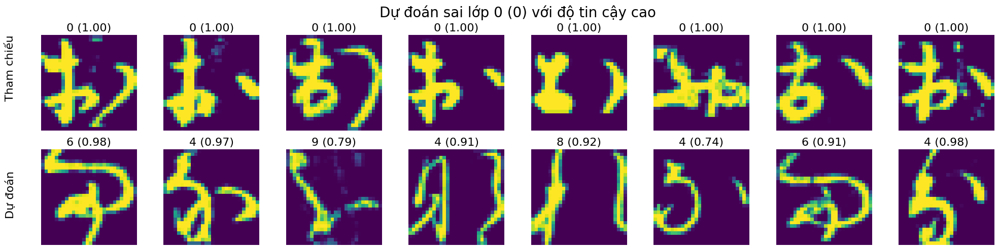

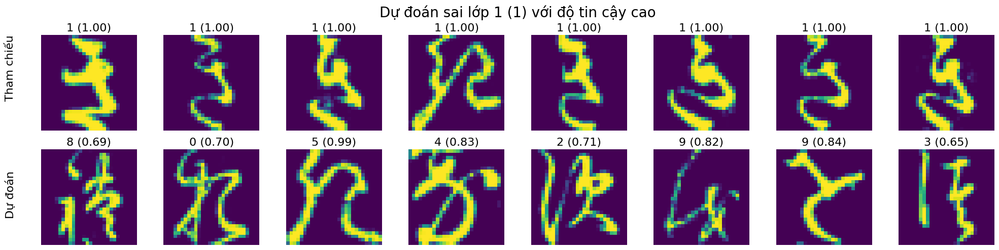

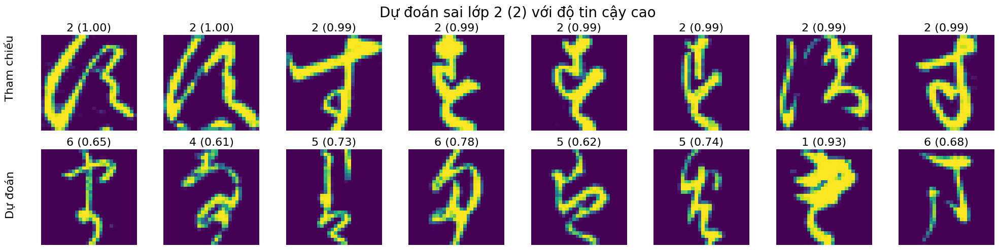

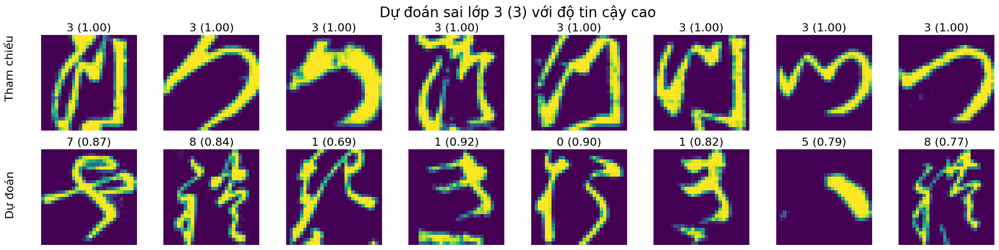

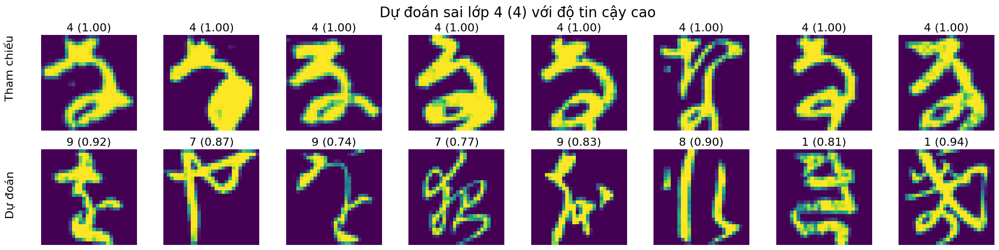

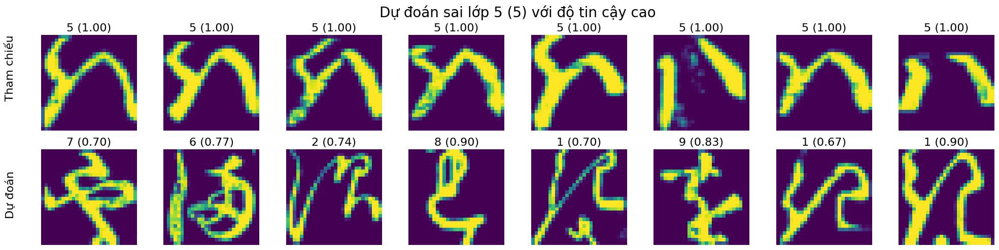

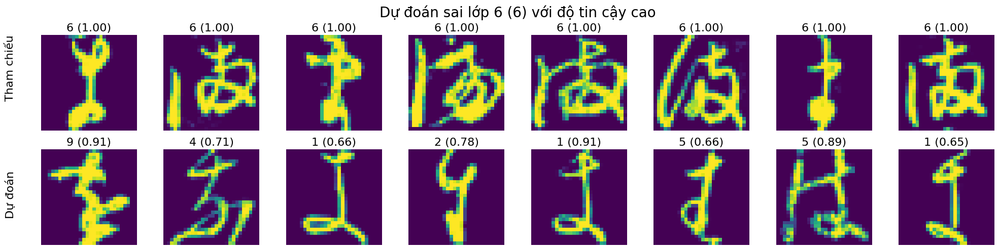

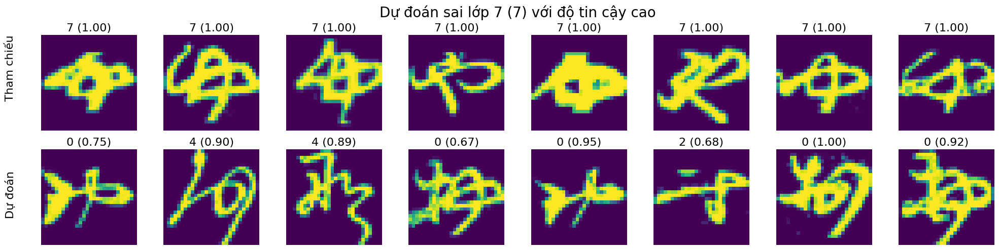

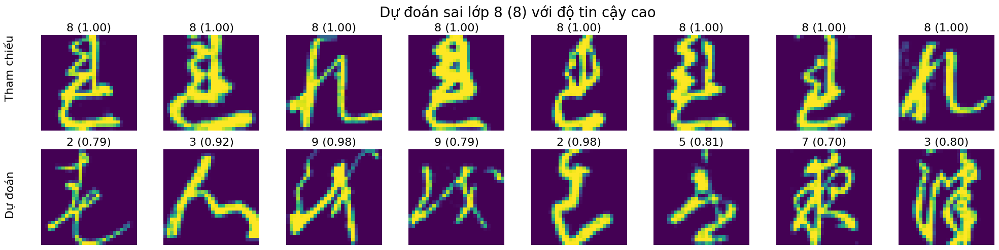

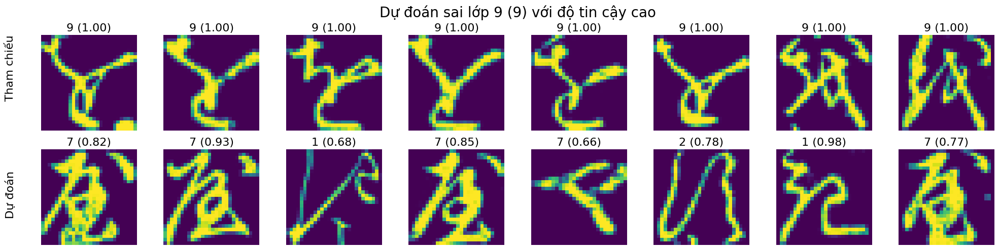

In [201]:
viz_prediction(selected_labels=np.arange(10),
                  df=df, test_images=test_images,
                  group="high",
                  correct=False,
                  nsamples=8,
                  ds_mean=ds_mean, ds_std=ds_std,
                  figsize=(10, 4))

- Mô hình dự đoán sai với độ tin cậy cao là do:
    - Các chữ viết có hình dáng, vị trí tương tự nhau

### 11.3. 📈 Phân tích mẫu đúng

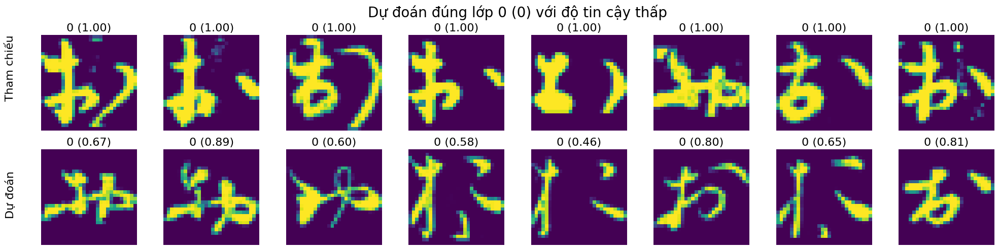

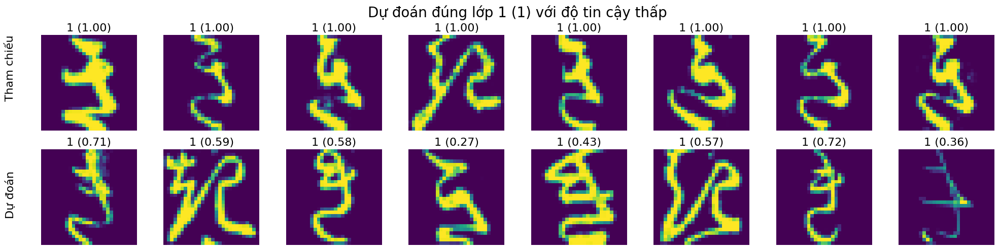

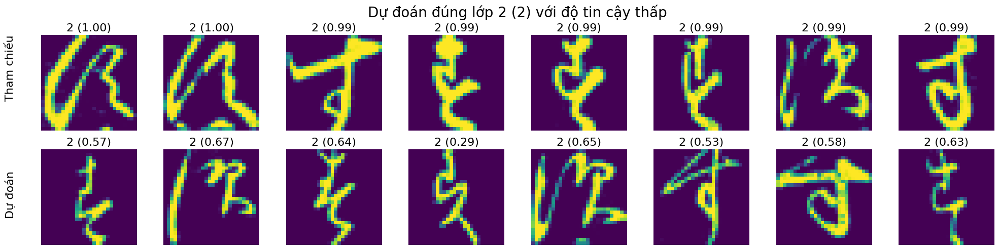

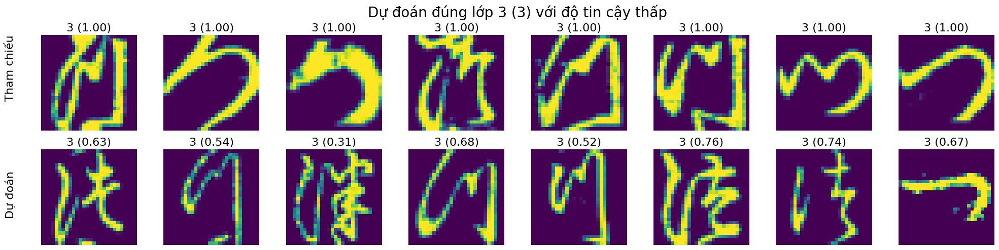

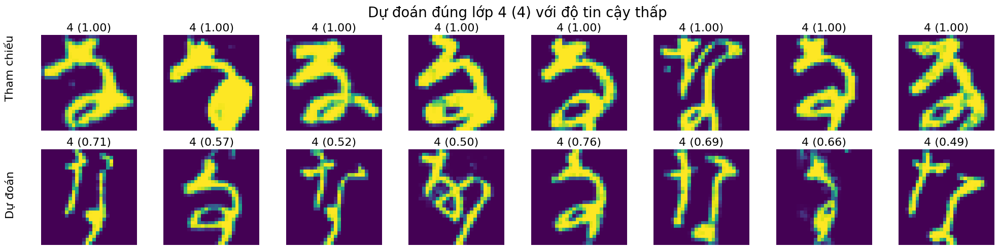

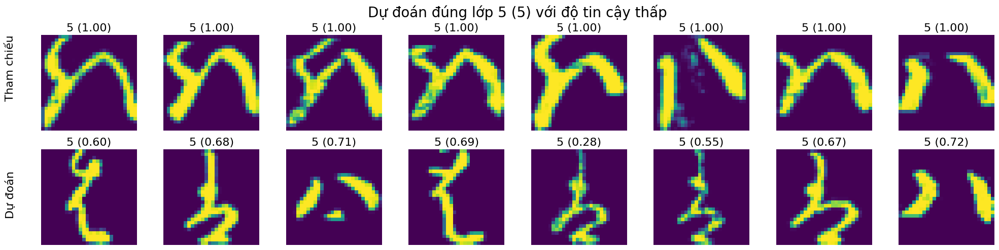

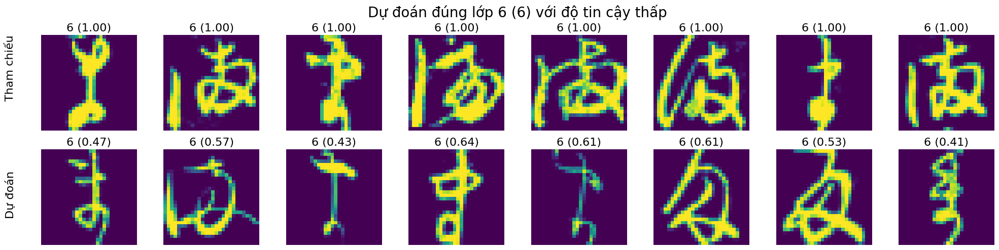

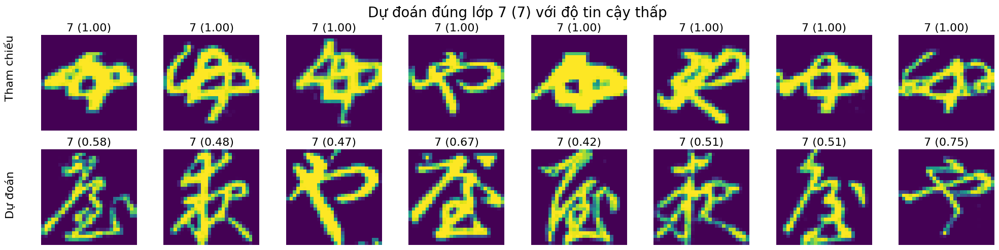

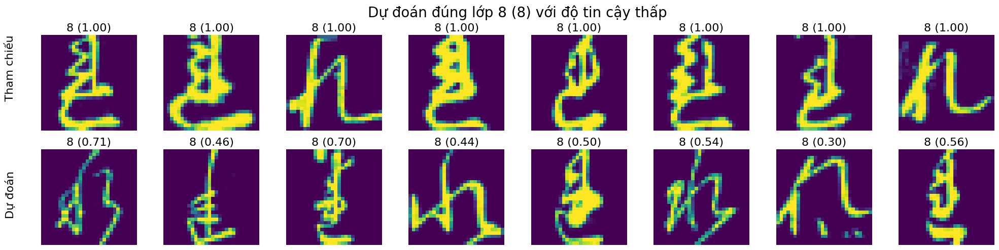

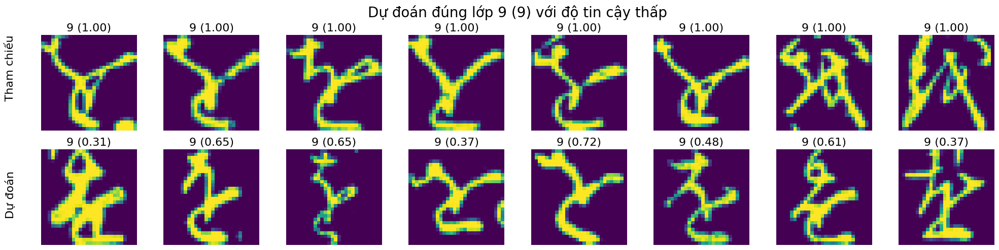

In [202]:
viz_prediction(selected_labels=np.arange(10),
                  df=df, test_images=test_images,
                  group="low",
                  correct=True,
                  nsamples=8)

- Mô hình dự đoán đúng với độ tin cậy thấp là do:
    - Do các chi tiết giữa những lần viết tương ác đối khác nhau.

## 🎨 (12) Vẽ đồ thị hàm tổn thất và độ chính xác
****

### 12.1. ⚙️ Hàm vẽ đồ thị tổn thất và độ chính xác
****

In [203]:
import matplotlib.pyplot as plt

def plot_learning_curves(history, model_name="Model"):
    epochs = range(1, len(history["train_loss"]) + 1)

    fig, axs = plt.subplots(1, 2, figsize=(14, 5))

    # === Plot Loss ===
    axs[0].plot(epochs, history["train_loss"], label="Train Loss", marker="o")
    axs[0].plot(epochs, history["val_loss"], label="Val Loss", marker="o")
    axs[0].set_title(f"{model_name} - Loss Curve")
    axs[0].set_xlabel("Epoch")
    axs[0].set_ylabel("Loss")
    axs[0].legend()
    axs[0].grid(True)

    # === Plot Accuracy ===
    axs[1].plot(epochs, history["train_acc"], label="Train Acc", marker="o")
    axs[1].plot(epochs, history["val_acc"], label="Val Acc", marker="o")
    axs[1].set_title(f"{model_name} - Accuracy Curve")
    axs[1].set_xlabel("Epoch")
    axs[1].set_ylabel("Accuracy")
    axs[1].legend()
    axs[1].grid(True)

    plt.tight_layout()
    plt.show()

### 12.2. 🎨 Vẽ các learning curves
****

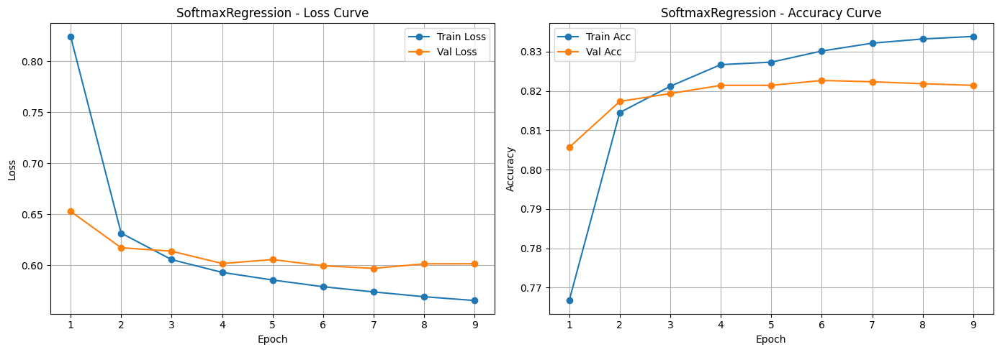

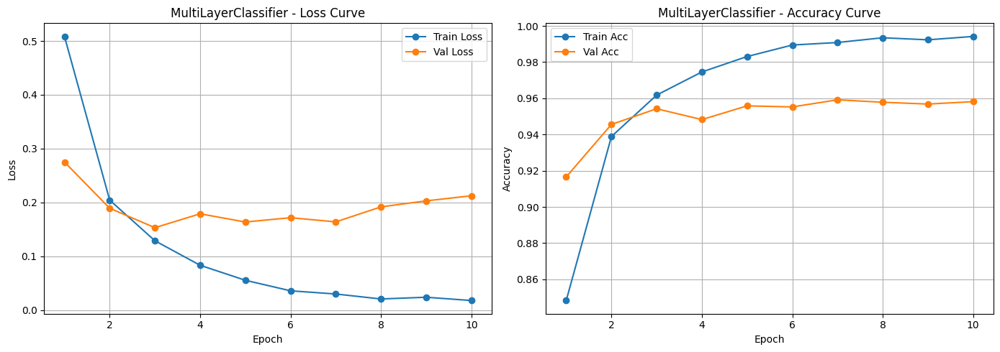

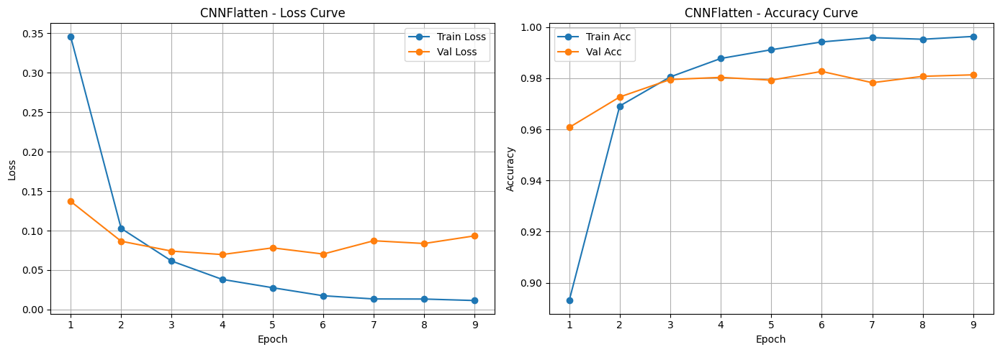

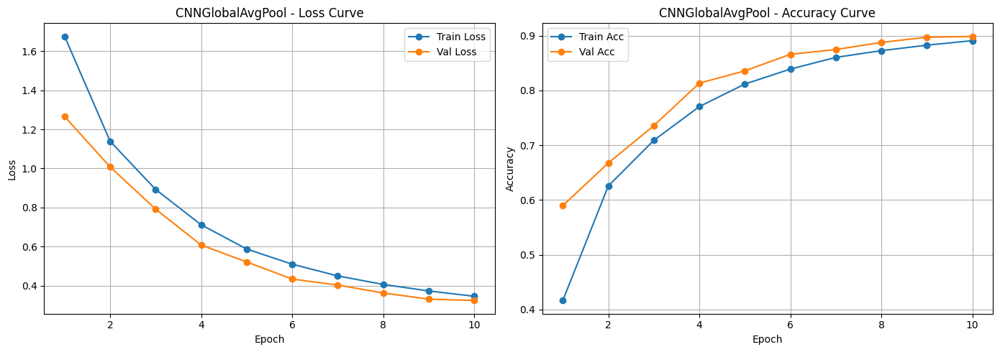

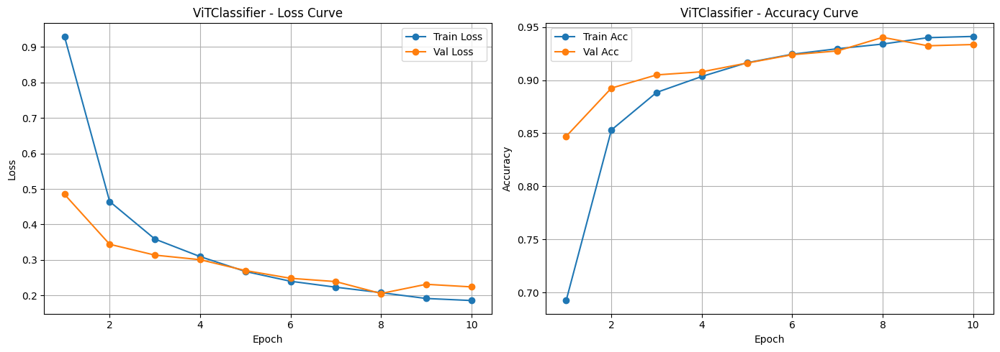

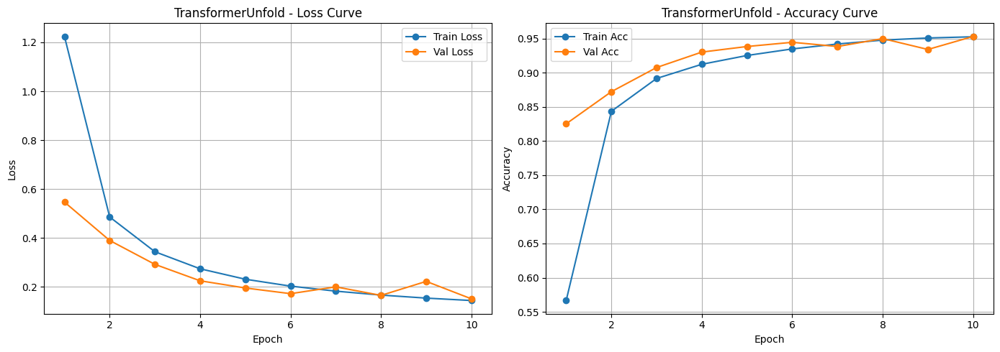

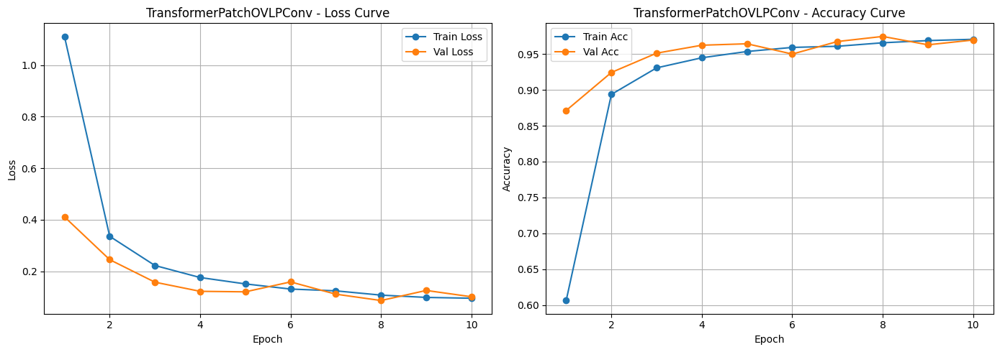

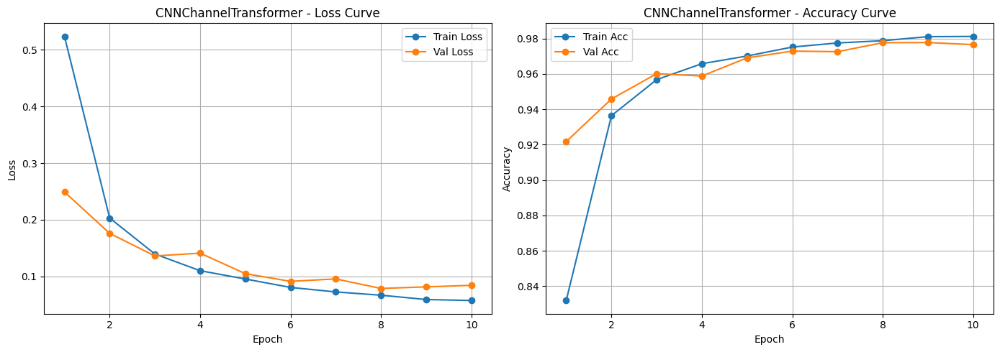

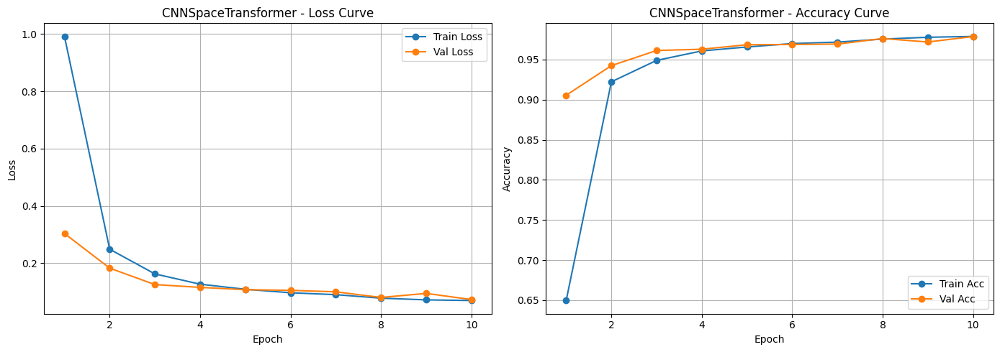

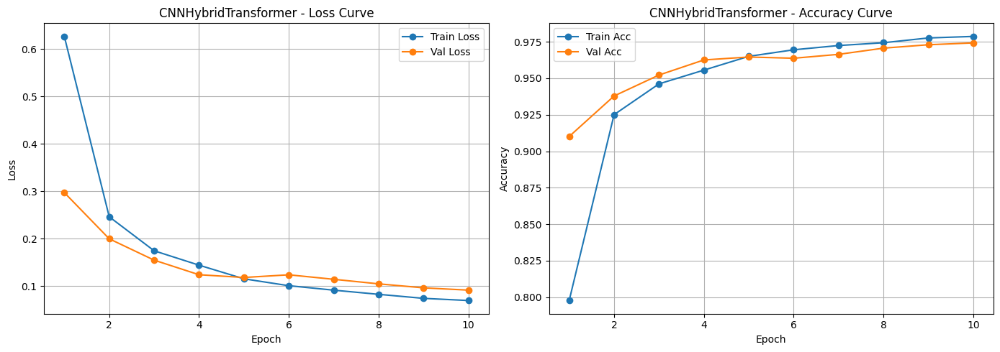

In [204]:
# Vẽ learning curve
for model_name, history in training_histories.items():
  plot_learning_curves(history, model_name)

1. SoftmaxRegression:
    - Biểu đồ Loss:
        - Training Loss giảm đều từ ~0.82 xuống ~0.58 → mô hình đang học tốt, không bị gián đoạn hay dao động lớn.
        - Validation Loss cũng giảm nhẹ nhưng chậm hơn, từ ~0.65 xuống ~0.60 → độ chênh giữa hai đường không lớn, tức là chưa có dấu hiệu overfitting nghiêm trọng
    - Biểu đồ Accuracy:
        - Training Accuracy tăng dần từ ~77% lên ~83% qua các epoch.
        - Validation Accuracy bắt đầu khá cao (~81%) và ổn định khoảng ~82% → cho thấy mô hình đang generalize khá tốt.
2. MultilayerClassifier:
    - Biểu đồ Loss:
        - Train Loss giảm đều từ ~0.5 → ~0.01 → mô hình đang học tốt và ổn định.
        - Val Loss giảm ban đầu nhưng dao động nhẹ quanh mức ~0.2 → khả năng tổng quát hóa tương đối tốt nhưng chưa tối ưu.    
    - Biểu đồ Accuracy:
        - Train Accuracy tăng từ ~86% → gần 100% → mô hình học triệt để dữ liệu huấn luyện.
        - Val Accuracy tăng nhanh rồi ổn định ở mức ~94% → tổng quát hóa khá tốt nhưng thấp hơn train.
3. CNNFlatten:
    - Biểu đồ Loss:
        - Train Accuracy: tăng nhanh đến ~99.8% → gần như hoàn hảo.
        - Val Accuracy: đạt ~98% và duy trì ổn định → hiệu suất cao.
    - Biểu đồ Accuracy:
        - Train Accuracy tăng đều đến ~85%.
        - Val Accuracy cũng tăng, đạt ~83–84%.
4. CNNGlobalAvgPool:
    - Biểu đồ Loss:
        - Train Loss giảm đều từ ~1.6 xuống ~0.4 → mô hình học ổn định, không giật cục.
        - Validation Loss bắt đầu thấp hơn train loss, giảm gần tương đương → mô hình không overfit
    - Biểu đồ Accuracy:
        - Train Accuracy tăng từ ~40% đến ~90%.
        - Val Accuracy tăng đều và luôn bám sát train → khả năng tổng quát hóa tốt.
5. ViTClassifier:
    - Biểu đồ Loss:
        - Train Loss giảm mạnh ban đầu (~0.9 → ~0.2), nhưng chững lại sau khoảng 4 epoch.
        - Val Loss gần tương đồng với train loss, ít dao động → không overfit, nhưng cũng không tiến triển nhiều.
    - Biểu đồ Accuracy:
        - Train Accuracy tăng nhanh rồi ổn định ở ~90%.
        - Val Accuracy cũng đạt ~90%, nhưng không có cải thiện rõ rệt sau 5–6 epoch đầu.
6. TransformerUnfold:
    - Biểu đồ Loss:
        - Train Loss ban đầu cao hơn (~1.2), nhưng giảm đều đến ~0.2 → vẫn học ổn định.
        - Validation Loss từ ~0.6 → ~0.2 → chậm hơn train nhưng vẫn tốt.
    - Biểu đồ Accuracy:
        - Train Accuracy tăng từ ~55% → ~90% → tốc độ học ban đầu chậm hơn ViT, nhưng bắt kịp về sau.
        - Validation Accuracy bắt đầu ~80%, tăng đều đến ~90%.
7. TransformerPatchOVLConv:
    - Biểu đồ Loss:
        - Train Loss giảm đều từ ~0.9 xuống ~0.2 → mô hình học khá ổn định.
        - Val Loss ban đầu cao (~0.6), nhưng giảm liên tục và sát với train loss cuối epoch → tổng quát hóa tốt.
    - Biểu đồ Accuracy:
        - Train Accuracy tăng từ ~70% lên đến ~90%.
        - Val Accuracy tăng đều và gần sát train (~89%) → mô hình không bị overfit, phản ánh khả năng học hiệu quả và ổn định.
8. CNNChannelTransformer:
    - Biểu đồ Loss:
        - Train Loss giảm đều từ ~0.6 đến ~0.15 → học tốt.
        - Val Loss thấp hơn train từ đầu và duy trì sát nhau → cực kỳ ổn định.
    - Biểu đồ Accuracy:    
       - Train Accuracy: tăng đều từ ~80% → ~92%.
        - Val Accuracy: cũng tăng ổn định từ ~85% → ~91% → duy trì khoảng cách rất nhỏ so với train.
9. CNNSpaceTransformer:
    - Biểu đồ Loss:
        - Train Loss giảm mạnh từ ~1.0 xuống ~0.2 trong vài epoch đầu, sau đó ổn định → mô hình học khá tốt.
        - Val Loss bắt đầu giảm giống train, nhưng dao động nhẹ ở cuối → có dấu hiệu dừng cải thiện hoặc bắt đầu overfit nhẹ.
    - Biểu đồ Accuracy:
        - Train Accuracy tăng đều từ ~65% lên ~90% → tốc độ học tốt.
        - Val Accuracy tăng từ ~70% lên ~89%, hơi dao động ở cuối → mô hình tổng quát hóa tương đối ổn, nhưng chưa hoàn hảo.
10. CNNHybridTransformer:
    - Biểu đồ Loss:
        - Train Loss giảm đều và rất nhanh từ ~0.6 → ~0.05 → học cực kỳ hiệu quả.
        - Val Loss bám sát train loss và giảm đều đến mức rất thấp → mô hình khớp tốt với dữ liệu kiểm tra.
    - Biểu đồ Accuracy:
        - Train Accuracy tăng đều đến ~98%, không bị giật.
        - Val Accuracy tăng song song với train, đạt ~97.5%, cực kỳ ổn định.
